# COVID-19 Literature Clustering

https://www.kaggle.com/maksimeren/covid-19-literature-clustering

In [1]:
#from IPython.display import Image
#Image(filename='/kaggle/input/screen-shot/screen_shot.png', width=800) 

In [2]:
# 追加
import time
import datetime # 時間の変換

### You can find the full version of the interactive plot here on GitHub: 
#### https://maksimekin.github.io/COVID19-Literature-Clustering/plots/t-sne_covid-19_interactive.html
Because of its size, I can only put the smaller version on this Notebook.



### Goal
Given a large amount of literature and rapidly spreading COVID-19, it is difficult for a scientist to keep up with the research community promptly. Can we cluster similar research articles together to make it easier for health professionals to find relevant research articles? Clustering can be used to create a tool to identify similar articles, given a target article. It can also reduce the number of articles one has to go through as one can focus on a cluster of articles rather than all. 

**Approach**:
<ol>
    <li>Unsupervised Learning task, because we don't have labels for the articles</li>
    <li>Clustering and Dimensionality Reduction task </li>
    <li>See how well labels from K-Means classify</li>
    <li>Use N-Grams with Hash Vectorizer</li>
    <li>Use plain text with Tf-idf</li>
    <li>Use K-Means for clustering</li>
    <li>Use t-SNE for dimensionality reduction</li>
    <li>Use PCA for dimensionality reduction</li>
    <li>There is no continuous flow of data, no need to adjust to changing data, and the data is small enough to fit in memmory: Batch Learning</li>
    <li>Altough, there is no continuous flow of data, our approach has to be scalable as there will be more literature later</li>
</ol>

### Dataset Description

>*In response to the COVID-19 pandemic, the White House and a coalition of leading research groups have prepared the COVID-19 Open Research Dataset (CORD-19). CORD-19 is a resource of over 29,000 scholarly articles, including over 13,000 with full text, about COVID-19, SARS-CoV-2, and related coronaviruses. This freely available dataset is provided to the global research community to apply recent advances in natural language processing and other AI techniques to generate new insights in support of the ongoing fight against this infectious disease. There is a growing urgency for these approaches because of the rapid acceleration in new coronavirus literature, making it difficult for the medical research community to keep up.*
#### Cite: [COVID-19 Open Research Dataset Challenge (CORD-19) | Kaggle](https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge) <br>

**Clustering section of the project (cite):** *Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow*, 2nd Edition, by Aurelien Geron (O'Reilly). Copyright 2019 Kiwisoft S.A.S, 978-1-492-03264-9. Machine Learning Practice. Implimenting this section following the Chapter-9 project on O'REILLY's Hands-On Machine Learning. <br>

# Load the Data
Load the data following the notebook by Ivan Ega Pratama, from Kaggle.
#### Cite: [Dataset Parsing Code | Kaggle, COVID EDA: Initial Exploration Tool](https://www.kaggle.com/ivanegapratama/covid-eda-initial-exploration-tool)

### Loading Metadata

In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import json

import matplotlib.pyplot as plt
plt.style.use('ggplot')

Let's load the metadata of the dateset. 'title' and 'journal' attributes may be useful later when we cluster the articles to see what kinds of articles cluster together.

In [4]:
#!ls /kaggle/input/CORD-19-research-challenge/

In [5]:
#root_path = '/kaggle/input/CORD-19-research-challenge/'
root_path = './CORD-19-research-challenge/2020-03-20/'
metadata_path = f'{root_path}/metadata.csv'
meta_df = pd.read_csv(metadata_path, dtype={
    'pubmed_id': str,
    'Microsoft Academic Paper ID': str, 
    'doi': str
})
meta_df.head()

,sha,source_x,title,doi,pmcid,pubmed_id,license,abstract,publish_time,authors,journal,Microsoft Academic Paper ID,WHO #Covidence,has_full_text,full_text_file
0,NaN,Elsevier,Intrauterine virus infections and congenital h...,10.1016/0002-8703(72)90077-4,NaN,4361535,els-covid,Abstract The etiologic basis for the vast majo...,1972-12-31,"Overall, James C.",American Heart Journal,NaN,NaN,False,custom_license
1,NaN,Elsevier,Coronaviruses in Balkan nephritis,10.1016/0002-8703(80)90355-5,NaN,6243850,els-covid,NaN,1980-03-31,"Georgescu, Leonida; Diosi, Peter; Buţiu, Ioan;...",American Heart Journal,NaN,NaN,False,custom_license
2,NaN,Elsevier,Cigarette smoking and coronary heart disease: ...,10.1016/0002-8703(80)90356-7,NaN,7355701,els-covid,NaN,1980-03-31,"Friedman, Gary D",American Heart Journal,NaN,NaN,False,custom_license
3,aecbc613ebdab36753235197ffb4f35734b5ca63,Elsevier,Clinical and immunologic studies in identical ...,10.1016/0002-9343(73)90176-9,NaN,4579077,els-covid,"Abstract Middle-aged female identical twins, o...",1973-08-31,"Brunner, Carolyn M.; Horwitz, David A.; Shann,...",The American Journal of Medicine,NaN,NaN,True,custom_license
4,NaN,Elsevier,Epidemiology of community-acquired respiratory...,10.1016/0002-9343(85)90361-4,NaN,4014285,els-covid,Abstract Upper respiratory tract infections ar...,1985-06-28,"Garibaldi, Richard A.",The American Journal of Medicine,NaN,NaN,False,custom_license


In [6]:
meta_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44220 entries, 0 to 44219
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   sha                          28462 non-null  object
 1   source_x                     44220 non-null  object
 2   title                        43996 non-null  object
 3   doi                          40750 non-null  object
 4   pmcid                        23319 non-null  object
 5   pubmed_id                    22943 non-null  object
 6   license                      44220 non-null  object
 7   abstract                     35806 non-null  object
 8   publish_time                 34197 non-null  object
 9   authors                      41074 non-null  object
 10  journal                      33173 non-null  object
 11  Microsoft Academic Paper ID  964 non-null    object
 12  WHO #Covidence               1767 non-null   object
 13  has_full_text                44

### Fetch All of JSON File Path

Get path to all JSON files:

In [7]:
all_json = glob.glob(f'{root_path}/**/*.json', recursive=True)
len(all_json)

29315

### Helper Functions

 File Reader Class

In [8]:
class FileReader:
    def __init__(self, file_path):
        with open(file_path) as file:
            content = json.load(file)
            self.paper_id = content['paper_id']
            self.abstract = []
            self.body_text = []
            # Abstract
            for entry in content['abstract']:
                self.abstract.append(entry['text'])
            # Body text
            for entry in content['body_text']:
                self.body_text.append(entry['text'])
            self.abstract = '\n'.join(self.abstract)
            self.body_text = '\n'.join(self.body_text)
    def __repr__(self):
        return f'{self.paper_id}: {self.abstract[:200]}... {self.body_text[:200]}...'
first_row = FileReader(all_json[0])
print(first_row)

0015023cc06b5362d332b3baf348d11567ca2fbb: word count: 194 22 Text word count: 5168 23 24 25 author/funder. All rights reserved. No reuse allowed without permission. Abstract 27 The positive stranded RNA genomes of picornaviruses comprise a si... VP3, and VP0 (which is further processed to VP2 and VP4 during virus assembly) (6). The P2 64 and P3 regions encode the non-structural proteins 2B and 2C and 3A, 3B (1-3) (VPg), 3C pro and 4 structura...


Helper function adds break after every words when character length reach to certain amount. This is for the interactive plot so that hover tool fits the screen.

In [9]:
def get_breaks(content, length):
    data = ""
    words = content.split(' ')
    total_chars = 0

    # add break every length characters
    for i in range(len(words)):
        total_chars += len(words[i])
        if total_chars > length:
            data = data + "<br>" + words[i]
            total_chars = 0
        else:
            data = data + " " + words[i]
    return data

### Load the Data into DataFrame

Using the helper functions, let's read in the articles into a DataFrame that can be used easily:

In [10]:
# 時間がかかります。
start = time.time() # 計算前の時間取得

dict_ = {'paper_id': [], 'abstract': [], 'body_text': [], 'authors': [], 'title': [], 'journal': [], 'abstract_summary': []}
for idx, entry in enumerate(all_json):
    if idx % (len(all_json) // 10) == 0:
        print(f'Processing index: {idx} of {len(all_json)}')
    content = FileReader(entry)
    
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    # no metadata, skip this paper
    if len(meta_data) == 0:
        continue
    
    dict_['paper_id'].append(content.paper_id)
    dict_['abstract'].append(content.abstract)
    dict_['body_text'].append(content.body_text)
    
    # also create a column for the summary of abstract to be used in a plot
    if len(content.abstract) == 0: 
        # no abstract provided
        dict_['abstract_summary'].append("Not provided.")
    elif len(content.abstract.split(' ')) > 100:
        # abstract provided is too long for plot, take first 300 words append with ...
        info = content.abstract.split(' ')[:100]
        summary = get_breaks(' '.join(info), 40)
        dict_['abstract_summary'].append(summary + "...")
    else:
        # abstract is short enough
        summary = get_breaks(content.abstract, 40)
        dict_['abstract_summary'].append(summary)
        
    # get metadata information
    meta_data = meta_df.loc[meta_df['sha'] == content.paper_id]
    
    try:
        # if more than one author
        authors = meta_data['authors'].values[0].split(';')
        if len(authors) > 2:
            # more than 2 authors, may be problem when plotting, so take first 2 append with ...
            dict_['authors'].append(". ".join(authors[:2]) + "...")
        else:
            # authors will fit in plot
            dict_['authors'].append(". ".join(authors))
    except Exception as e:
        # if only one author - or Null valie
        dict_['authors'].append(meta_data['authors'].values[0])
    
    # add the title information, add breaks when needed
    try:
        title = get_breaks(meta_data['title'].values[0], 40)
        dict_['title'].append(title)
    # if title was not provided
    except Exception as e:
        dict_['title'].append(meta_data['title'].values[0])
    
    # add the journal information
    dict_['journal'].append(meta_data['journal'].values[0])
    
df_covid = pd.DataFrame(dict_, columns=['paper_id', 'abstract', 'body_text', 'authors', 'title', 'journal', 'abstract_summary'])
df_covid.head()

Processing index: 0 of 29315
Processing index: 2931 of 29315
Processing index: 5862 of 29315
Processing index: 8793 of 29315
Processing index: 11724 of 29315
Processing index: 14655 of 29315
Processing index: 17586 of 29315
Processing index: 20517 of 29315
Processing index: 23448 of 29315
Processing index: 26379 of 29315
Processing index: 29310 of 29315


,paper_id,abstract,body_text,authors,title,journal,abstract_summary
0,0015023cc06b5362d332b3baf348d11567ca2fbb,word count: 194 22 Text word count: 5168 23 24...,"VP3, and VP0 (which is further processed to VP...","Ward, J. C. J.. Lasecka-Dykes, L....",The RNA pseudoknots in foot-and-mouth disease...,NaN,word count: 194 22 Text word count: 5168 23 2...
1,004f0f8bb66cf446678dc13cf2701feec4f36d76,,The 2019-nCoV epidemic has spread across China...,Hanchu Zhou. Jianan Yang...,Healthcare-resource-adjusted<br>vulnerabiliti...,NaN,Not provided.
2,00d16927588fb04d4be0e6b269fc02f0d3c2aa7b,Infectious bronchitis (IB) causes significant ...,"Infectious bronchitis (IB), which is caused by...","Butt, S. L.. Erwood, E. C....","Real-time, MinION-based, amplicon<br>sequenci...",NaN,Infectious bronchitis (IB) causes<br>signific...
3,0139ea4ca580af99b602c6435368e7fdbefacb03,Nipah Virus (NiV) came into limelight recently...,Nipah is an infectious negative-sense single-s...,Nishi Kumari. Ayush Upadhyay...,A Combined Evidence Approach to Prioritize<br...,NaN,Nipah Virus (NiV) came into limelight recentl...
4,013d9d1cba8a54d5d3718c229b812d7cf91b6c89,Background: A novel coronavirus (2019-nCoV) em...,"In December 2019, a cluster of patients with p...",Shengjie Lai. Isaac Bogoch...,Assessing spread risk of Wuhan novel<br>coron...,NaN,Background: A novel coronavirus (2019-nCoV)<b...


In [11]:
calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:08:52.727061


In [12]:
dict_ = None

### stopwords による不要後の削除

In [46]:
# importing stopwords
f = open('stopwords-en.txt',encoding='utf-8_sig') #encoding='utf-8_sig'を追加
stopword = f.read()
f.close()

In [47]:
stop = set(stopword.split())
print(stop)

{'um', 'whod', 'kh', 'thanx', 'being', 'kw', 'hopefully', 'nothing', 'om', 'amoungst', 'hence', 'become', 'differ', 'g', 'information', 'ltd', 'cc', 'thanks', 'youll', 'latter', 'somehow', '2020', 'kp', 'hu', 'hither', 'co.', 'int', 'many', 'downing', 'mu', 'probably', 'near', 'awfully', 'con', 'vu', 'number', 'small', 'wanted', 'differently', 'felt', 'call', 'great', 'nf', 'hereafter', 'similarly', 'fewer', 'hundred', 'f', 'actually', 'qv', 'refer', 'uy', 'while', "would've", 'particular', "ain't", 'works', 'begin', 'co', 'best', "it'd", 'presumably', 'youd', 'greetings', 'wed', 'whoever', 'backward', '2019', 'cr', 'maynt', 'was', 'any', 'each', 'area', 'az', 'bb', 'anybody', 'group', 'zr', 'b', 'far', 'cmon', 'for', 'make', 'newest', 'refs', 'try', 'bh', 'whom', 'accordingly', 'ug', 'will', 'thorough', 'myself', 'obtain', 'ly', 'normally', 'recent', 'didn', 'gotten', 'tr', 'there', 'tt', "why'd", 'dj', 'click', 'became', 'insofar', 'mm', 'owing', "c's", 'place', 'netscape', 'p', 'nay

In [48]:
start = time.time() # 計算前の時間取得

# https://stackoverflow.com/questions/29523254/python-remove-stop-words-from-pandas-dataframe
# DataFrame の１行ずつ stop_words を削除
df_covid['body_text_stop'] = df_covid['body_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop)]))

calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:00:21.794549


In [49]:
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,body_text_stop,tfidf
0,0015023cc06b5362d332b3baf348d11567ca2fbb,word count: 194 22 Text word count: 5168 23 24...,"VP3, and VP0 (which is further processed to VP...","Ward, J. C. J.. Lasecka-Dykes, L....",The RNA pseudoknots in foot-and-mouth disease...,NaN,word count: 194 22 Text word count: 5168 23 2...,"VP3, VP0 (which processed VP2 VP4 virus assemb...","[doi, 1101, holder, 2020, peer, funder, permis..."
1,004f0f8bb66cf446678dc13cf2701feec4f36d76,,The 2019-nCoV epidemic has spread across China...,Hanchu Zhou. Jianan Yang...,Healthcare-resource-adjusted<br>vulnerabiliti...,NaN,Not provided.,2019-nCoV epidemic spread China 24 countries 1...,"[cities, wuhan, healthcare, 2019, resources, 2..."
2,00d16927588fb04d4be0e6b269fc02f0d3c2aa7b,Infectious bronchitis (IB) causes significant ...,"Infectious bronchitis (IB), which is caused by...","Butt, S. L.. Erwood, E. C....","Real-time, MinION-based, amplicon<br>sequenci...",NaN,Infectious bronchitis (IB) causes<br>signific...,"Infectious bronchitis (IB), caused infectious ...","[ibv, reads, samples, sequencing, lineage, doi..."
3,0139ea4ca580af99b602c6435368e7fdbefacb03,Nipah Virus (NiV) came into limelight recently...,Nipah is an infectious negative-sense single-s...,Nishi Kumari. Ayush Upadhyay...,A Combined Evidence Approach to Prioritize<br...,NaN,Nipah Virus (NiV) came into limelight recentl...,Nipah infectious negative-sense single-strande...,"[nipah, compounds, fda, inhibitors, virus, nk,..."
4,013d9d1cba8a54d5d3718c229b812d7cf91b6c89,Background: A novel coronavirus (2019-nCoV) em...,"In December 2019, a cluster of patients with p...",Shengjie Lai. Isaac Bogoch...,Assessing spread risk of Wuhan novel<br>coron...,NaN,Background: A novel coronavirus (2019-nCoV)<b...,"December 2019, cluster patients pneumonia unkn...","[wuhan, cities, 2020, city, travel, risk, chin..."


In [50]:
df_covid.shape

(27678, 9)

### body_text を TF-IDF をして、全文章中の重要ワードを抽出

In [51]:
# https://www.takapy.work/entry/2019/01/14/142128

#import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDFの計算
tfidf_vectorizer = TfidfVectorizer(min_df = 0.03)

start = time.time() # 計算前の時間取得

# 文章内の全単語のTfidf値を取得
tfidf_matrix = tfidf_vectorizer.fit_transform(df_covid['body_text_stop']) # stopwords による不要後の削除後の全テキストで TF-IDF

calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:00:57.830719


In [52]:
start = time.time() # 計算前の時間取得

# index 順の単語リスト
terms = tfidf_vectorizer.get_feature_names()

calc_time = time.time() - start # 計算時
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:00:00.004990


In [53]:
start = time.time() # 計算前の時間取得

# 単語毎のtfidf値配列を取得：TF-IDF 行列 (numpy の ndarray 形式で取得される)
# 1つ目の文書に対する、各単語のベクトル値
# 2つ目の文書に対する、各単語のベクトル値
# ・・・
# が取得できる（文書の数 * 全単語数）の配列になる。（toarray()で密行列に変換）
tfidfs = tfidf_matrix.toarray()

calc_time = time.time() - start # 計算時
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:00:00.577456


In [54]:
# 形状
tfidfs.shape

(27678, 5781)

In [55]:
# TF-IDF の結果からi 番目のドキュメントの特徴的な上位 n 語を取り出す関数
# terms = 単語リスト
# tfidfs = TF-IDF行列
def extract_feature_words(terms, tfidfs, i, n):
    tfidf_array = tfidfs[i]
    top_n_idx = tfidf_array.argsort()[-n:][::-1]
    words = [terms[idx] for idx in top_n_idx]
    return words

# 新しい列を追加
df_covid['tfidf'] = ''

# 結果の出力
for i in range(0, len(df_covid['body_text_stop'])):
    print ('------------------------------------------')
    feature_words = extract_feature_words(terms, tfidfs, i, 10) # 抽出する数を指定する
    print ('feature_words:')
    print(feature_words)
    df_covid.at[i, 'tfidf'] = feature_words

------------------------------------------
feature_words:
['doi', '1101', 'holder', '2020', 'peer', 'funder', 'permission', 'https', 'reserved', 'rights']
------------------------------------------
feature_words:
['cities', 'wuhan', 'healthcare', '2019', 'resources', '2020', 'epidemic', 'january', 'vulnerable', 'province']
------------------------------------------
feature_words:
['ibv', 'reads', 'samples', 'sequencing', 'lineage', 'doi', 'qpcr', 'isolates', 'sample', 'funder']
------------------------------------------
feature_words:
['nipah', 'compounds', 'fda', 'inhibitors', 'virus', 'nk', 'libraries', 'properties', 'approved', 'drug']
------------------------------------------
feature_words:
['wuhan', 'cities', '2020', 'city', 'travel', 'risk', 'china', 'doi', 'international', '2019']
------------------------------------------
feature_words:
['category', 'entities', 'entity', 'genes', 'doi', 'granted', 'funder', 'holder', 'peer', 'author']
------------------------------------------

feature_words:
['quarantine', 'symptom', 'doi', 'monitoring', '1101', 'funder', 'holder', 'peer', 'https', 'contacts']
------------------------------------------
feature_words:
['sputum', 'throat', 'stool', 'swab', 'samples', 'cov', 'sars', 'viral', 'copies', 'patients']
------------------------------------------
feature_words:
['2019', 'meta', 'granted', 'funder', 'holder', 'author', 'display', 'literature', 'patients', 'articles']
------------------------------------------
feature_words:
['exacerbation', 'doi', 'sputum', 'airway', 'exacerbations', 'fig', 'holder', '1101', 'inflammation', 'funder']
------------------------------------------
feature_words:
['social', 'contact', 'school', 'closure', 'contacts', 'age', 'data', 'granted', 'funder', 'nd']
------------------------------------------
feature_words:
['connected', 'task', 'lesion', 'damage', 'doi', 'unrelated', 'left', 'participants', 'tasks', 'holder']
------------------------------------------
feature_words:
['drug', 'signatu

feature_words:
['mab', 'mice', 'mabs', 'neutralizing', 'escape', 'fig', 'immunization', 'mouse', 'treated', 'cross']
------------------------------------------
feature_words:
['china', 'cdc', 'health', 'doctors', 'tb', 'funding', 'public', 'rural', 'government', 'control']
------------------------------------------
feature_words:
['assay', 'ethanol', 'ph', 'substrate', 'assays', 'indicator', 'reaction', 'enzyme', 'hydrolysis', 'evaluation']
------------------------------------------
feature_words:
['risk', 'code', 'chest', 'providers', 'literature', 'injuries', 'patient', 'exposure', 'healthcare', 'gloves']
------------------------------------------
feature_words:
['recombination', 'markers', 'loci', 'plants', 'viral', 'frequency', 'frequencies', 'host', 'interference', 'genome']
------------------------------------------
feature_words:
['who', 'neglected', 'diseases', 'rabies', 'resolution', 'expert', 'health', 'control', 'meeting', 'zoonotic']
----------------------------------------

------------------------------------------
feature_words:
['coding', 'insects', 'expression', 'genes', 'regulate', 'rna', 'reported', 'regulation', 'immune', 'toll']
------------------------------------------
feature_words:
['patients', 'lung', 'zones', 'h1n1', 'consolidation', 'bilateral', 'icu', 'admitted', 'involvement', 'radiographs']
------------------------------------------
feature_words:
['hcv', 'rig', 'proteins', 'vesicles', 'replication', 'viral', 'er', 'rna', '44', 'cells']
------------------------------------------
feature_words:
['health', 'public', 'program', 'outbreak', 'outbreaks', 'projects', 'field', 'surveillance', 'building', 'response']
------------------------------------------
feature_words:
['pneumonia', 'adenovirus', 'immunocompetent', 'patients', 'admission', 'respiratory', 'chest', 'literature', 'community', 'acquired']
------------------------------------------
feature_words:
['steroid', 'rats', 'stimulation', 'bone', 'lipid', 'head', 'induced', 'expression'

feature_words:
['perceived', 'fever', '2010', 'survey', '2009', 'preventive', 'public', 'measures', 'anxiety', 'incidence']
------------------------------------------
feature_words:
['transmembrane', 'tyrosine', 'domain', 'cells', 'glycine', 'motifs', 'mutations', 'mutants', 'wild', 'nt']
------------------------------------------
feature_words:
['strains', 'glycoprotein', 'recombination', 'dogs', 'nt', '2016', 'selection', 'deduced', 'thailand', 'canine']
------------------------------------------
feature_words:
['sialic', 'he', 'acid', 'hemagglutinin', 'virus', 'receptor', 'activities', 'glycoproteins', 'workers', 'site']
------------------------------------------
feature_words:
['patients', 'skin', 'dna', 'blood', 'pcr', 'samples', 'biopsies', 'study', 'providers', 'health']
------------------------------------------
feature_words:
['real', 'time', 'dna', 'pcr', 'assay', 'copies', 'samples', 'detection', 'min', 'amplification']
------------------------------------------
feature_word

feature_words:
['calls', 'arrays', 'array', 'sequencing', 'variants', 'bases', 'false', 'probes', 'pcr', 'variant']
------------------------------------------
feature_words:
['cells', 'invasion', 'subsets', 'cm', 'tumor', 'macrophages', 'tokyo', 'expression', 'japan', 'co']
------------------------------------------
feature_words:
['intubation', 'airway', 'fit', 'type', 'device', 'devices', 'wearing', 'factor', 'fold', 'emergency']
------------------------------------------
feature_words:
['surveillance', 'netherlands', 'warning', 'china', 'infectious', 'disease', 'systems', 'diseases', 'signals', 'pneumonia']
------------------------------------------
feature_words:
['acetone', 'extract', 'antiviral', 'leaves', 'μg', 'plant', 'compounds', 'lesion', 'ml', 'tobacco']
------------------------------------------
feature_words:
['pools', 'reads', 'bats', 'phage', 'strains', 'bat', 'gastroenteritis', 'circular', 'viruses', 'strain']
------------------------------------------
feature_words:
[

feature_words:
['exacerbations', 'exacerbation', 'patients', 'frequent', 'phenotype', 'airway', 'inflammation', 'cardiovascular', 'frequency', 'inflammatory']
------------------------------------------
feature_words:
['mice', 'iga', 'mucosal', 'rotavirus', 'immunized', 'recombinant', 'immunization', 'porcine', 'anti', 'igg']
------------------------------------------
feature_words:
['news', 'government', 'advice', 'flu', 'coverage', 'uncertainty', 'risk', 'public', 'health', 'australia']
------------------------------------------
feature_words:
['placebo', 'visit', 'patients', 'cold', 'nasal', 'virus', 'treated', 'patient', 'population', 'subgroups']
------------------------------------------
feature_words:
['al', 'cells', 'entry', 'endocytosis', 'figure', 'treatment', 'cell', 'replication', 'virus', 'expression']
------------------------------------------
feature_words:
['datasets', 'proteins', 'amino', 'repeats', 'training', 'host', 'virus', 'window', 'dataset', 'performance']
------

feature_words:
['sources', 'news', 'internet', '91', 'survey', 'outbreak', 'surveillance', 'global', 'timely', 'epidemic']
------------------------------------------
feature_words:
['atp', 'activity', '59', 'poly', 'fig', 'phosphatase', 'mm', 'motif', 'labelled', 'lane']
------------------------------------------
feature_words:
['outbreak', 'counts', 'model', 'outbreaks', 'coverage', 'vaccination', 'transmission', 'regression', 'models', 'count']
------------------------------------------
feature_words:
['parasite', 'transcript', 'parasites', 'erythrocytes', 'genes', 'transcripts', 'gene', 'transcription', 'abundance', 'primers']
------------------------------------------
feature_words:
['ic', 'cov', 'activity', 'protein', 'ion', 'wt', 'mice', 'virus', 'il', 'mutant']
------------------------------------------
feature_words:
['ibv', 'chickens', 'vaccine', 'tracheal', 'vaccines', 'μl', 'buffer', 'chicken', 'urea', 'protein']
------------------------------------------
feature_words:
['ne

feature_words:
['chickens', 'µl', 'sub', 'viruses', 'mm', 'virus', 'cpe', 'challenged', 'korea', 'mdck']
------------------------------------------
feature_words:
['malaria', 'forest', 'workers', 'mobile', 'population', 'mobility', 'access', 'health', 'indices', 'migration']
------------------------------------------
feature_words:
['digestive', 'dietary', 'sodium', 'nacl', 'intake', 'at', 'mice', 'efficiency', 'fat', 'metabolic']
------------------------------------------
feature_words:
['infection', 'vaccine', 'virus', 'human', 'mabs', 'ligand', 'therapeutic', 'vaccines', 'animal', 'neutralizing']
------------------------------------------
feature_words:
['genes', 'cox', 'annotated', 'infection', 'expression', 'differentially', 'transcripts', 'gene', 'expressed', 'mrnas']
------------------------------------------
feature_words:
['pneumoniae', 'patient', 'sp', 'infections', 'secondary', 'parasitic', 'hospitalization', 'association', 'renal', 'epstein']
-------------------------------

feature_words:
['definitions', 'departments', 'definition', 'health', 'local', 'german', 'reporting', 'surveillance', 'examples', 'department']
------------------------------------------
feature_words:
['si', 'guangdong', 'isolate', 'pandemic', 'self', 'behavior', 'people', 'facing', 'behaviors', 'province']
------------------------------------------
feature_words:
['antibiotic', 'µg', 'lung', 'treatment', 'mice', 'bacterial', 'innate', 'combination', 'intranasal', 'antibacterial']
------------------------------------------
feature_words:
['rats', 'il', 'immune', 'challenge', 'cytokine', 'adjuvant', 'brain', 'sex', 'peripheral', 'cns']
------------------------------------------
feature_words:
['translation', 'figure', 'reporter', 'mrna', 'mm', 'complex', 'binding', 'interaction', 'complexes', 'supplementary']
------------------------------------------
feature_words:
['cancer', 'cells', 'tumor', 'kg', 'mg', 'chinese', 'caspase', 'cell', 'apoptosis', 'bearing']
--------------------------

['clustering', 'networks', 'network', 'degree', 'nodes', 'node', 'epidemic', 'outbreak', 'clustered', 'tree']
------------------------------------------
feature_words:
['t7', 'his', 'substrates', 'wt', 'substrate', 'replicase', 'protease', 'fig', 'ns', 'polyprotein']
------------------------------------------
feature_words:
['ga', 'cells', 'µm', 'mitochondrial', 'effects', 'cell', 'pre', 'neurons', 'treatment', 'treated']
------------------------------------------
feature_words:
['mitochondrial', 'ibv', 'egg', 'gland', 'μl', 'expression', 'dna', 'mitochondria', 'challenged', 'qpcr']
------------------------------------------
feature_words:
['sars', 'genes', 'gap', 'nc', 'specimens', 'patients', 'rank', 'severity', 'microarray', 'expression']
------------------------------------------
feature_words:
['dna', 'cells', 'airway', 'gc', 'apical', 'figure', 'infection', 'nt', 'hairpin', 'epithelial']
------------------------------------------
feature_words:
['cells', 'tumor', 'mice', 'c57bl',

['animals', 'calves', 'sick', 'blood', 'cytokine', 'genes', 'transcript', 'expression', 'values', 'rna']
------------------------------------------
feature_words:
['birds', 'avian', 'australian', 'australia', 'wild', 'viruses', 'detected', 'bird', 'herpesvirus', 'species']
------------------------------------------
feature_words:
['public', 'health', 'care', 'part', 'education', 'practitioners', 'educational', 'https', 'topics', 'schools']
------------------------------------------
feature_words:
['rt', 'di', 'rna', 'figure', 'interaction', 'replication', 'genome', 'wt', 'genomes', 'mutants']
------------------------------------------
feature_words:
['bats', 'species', 'bat', 'prevalence', 'adenoviruses', 'phylogenetic', 'european', 'presence', 'transmission', 'viruses']
------------------------------------------
feature_words:
['uv', 'infected', 'al', 'persistence', 'cells', 'host', 'co', 'stress', 'replication', 'figure']
------------------------------------------
feature_words:
['se

feature_words:
['cells', 'apoptosis', 'er', 'cell', 'stress', 'pathway', 'expression', 'fig', 'blotting', 'western']
------------------------------------------
feature_words:
['fusion', 'al', 'proteases', 'tail', 'viral', 'receptor', 'rna', 'protein', 'cell', 'structures']
------------------------------------------
feature_words:
['vitamin', 'dengue', 'concentrations', 'plasma', 'patients', 'secondary', 'healthy', 'complement', 'primary', 'controls']
------------------------------------------
feature_words:
['episodes', 'pneumonia', 'study', 'diagnosed', 'hospital', 'virus', 'elderly', 'respiratory', 'patients', 'dyspnea']
------------------------------------------
feature_words:
['sequences', 'nt', 'rna', 'spp', 'genes', 'rnas', 'phylogenetic', 'figure', 'splicing', 'trees']
------------------------------------------
feature_words:
['mice', 'macrophages', 'm2', 'no', 'infection', 'cells', 'viral', 'hbv', 'cell', 'macrophage']
------------------------------------------
feature_words:
[

['co', 'mono', 'patients', 'pneumonia', 'infection', 'infected', 'age', 'bacterial', 'ci', 'respiratory']
------------------------------------------
feature_words:
['genome', 'lineage', 'camels', 'library', 'mers', 'accession', 'cluster', 'genbank', '1a', 'cov']
------------------------------------------
feature_words:
['compounds', 'antibiotic', 'set', 'id', 'scheme', 'activity', 'training', 'model', 'active', 'database']
------------------------------------------
feature_words:
['items', 'searched', 'meta', 'categorized', 'bias', 'systemic', 'discrepancies', 'studies', 'included', 'review']
------------------------------------------
feature_words:
['il', 'mice', 'c57bl', 'pi', 'balb', 'infection', 'expression', '62', 'response', 'lung']
------------------------------------------
feature_words:
['genes', 'insect', 'metabolism', 'differentially', 'pathway', 'rna', 'gene', 'reads', 'figure', 'ubiquitin']
------------------------------------------
feature_words:
['domains', 'domain', 'pr

feature_words:
['oxygen', 'phosphatase', 'binding', 'hydrogen', 'peroxide', 'figure', 'polar', 'inactivation', 'nm', 'active']
------------------------------------------
feature_words:
['arrest', 'cardiac', 'simulation', 'protocol', 'team', 'sars', 'training', 'patient', 'equipment', 'we']
------------------------------------------
feature_words:
['113', 'un', 'mm', 'chains', 'affinity', 'fig', 'supplementary', 'complex', 'binding', 'atp']
------------------------------------------
feature_words:
['preparedness', 'planning', 'measures', 'hazards', 'health', 'measurement', 'authors', 'us', 'al', 'rigorous']
------------------------------------------
feature_words:
['proteases', 'hydrolysis', 'cleavage', 'peptides', 'peptide', 'amino', 'substrates', 'ms', 'food', 'parasites']
------------------------------------------
feature_words:
['wildlife', 'individuals', 'wild', 'species', 'pcr', 'μl', 'disease', 'respiratory', 'healthy', 'polyprotein']
------------------------------------------
fe

feature_words:
['peptide', 'kg', 'mice', 'mg', 'immunomodulatory', 'arthritis', 'day', 'cov', 'peptides', 'sars']
------------------------------------------
feature_words:
['rsv', 'head', 'antigenic', '210', 'only', 'monomer', 'neutralization', 'boost', 'neutralizing', 'antibodies']
------------------------------------------
feature_words:
['sc', 'mabs', 'mab', 'conversion', 'inhibition', 'mg', 'brain', 'formation', 'ml', 'hamster']
------------------------------------------
feature_words:
['proteins', 'protein', 'ms', 'mm', 'buffer', 'shanghai', 'μl', 'gfp', 'cells', 'immunoprecipitation']
------------------------------------------
feature_words:
['hiv', 'seronegative', 'dc', 'controls', 'polymorphism', 'exposed', 'allele', 'studies', 'infection', 'alleles']
------------------------------------------
feature_words:
['mabs', 'binding', 'neutralizing', 'mab', 'cap', 'neutralization', 'epitopes', 'activity', 'epitope', 'fig']
------------------------------------------
feature_words:
['te

['incomplete', 'patients', 'vs', 'korea', 'dl', 'laboratory', 'fever', 'platelet', 'clinical', 'days']
------------------------------------------
feature_words:
['variant', 'birds', 'wild', 's1', 'strains', 'recombination', 'poultry', 'viruses', 'bird', 'is']
------------------------------------------
feature_words:
['taiwan', 'women', '2010', '1996', 'rate', 'incidence', 'age', 'increased', '000', 'medical']
------------------------------------------
feature_words:
['aa', 'vp1', 'epitope', 'simulation', 'file', 'pressure', 'protein', 'mapping', 'spots', 'epitopes']
------------------------------------------
feature_words:
['dcs', 'cells', 'ii', 'fig', 'pigs', 'mhc', 'mycoplasma', 'μg', 'cat', 'pig']
------------------------------------------
feature_words:
['2014', '2015', 'epidemic', 'guinea', 'model', 'ebola', 'reproduction', 'july', 'confirmed', 'estimates']
------------------------------------------
feature_words:
['ch', '2012', 'nt', 'sequence', 'genome', 'complete', 'china', 'id

feature_words:
['hybridization', 'genome', '2004', 'da', 'whole', 'metabolism', 'suppression', 'comparisons', 'full', 'cdna']
------------------------------------------
feature_words:
['data', 'news', 'articles', 'influenza', 'week', 'patients', 'internet', 'predict', 'visits', 'ratio']
------------------------------------------
feature_words:
['al', 'nipah', 'bats', '2018', 'virus', 'pigs', '2017', 'fruit', 'infection', 'viral']
------------------------------------------
feature_words:
['mortality', 'cardiovascular', 'air', 'μg', 'cumulative', 'elderly', 'day', 'daily', 'er', 'effects']
------------------------------------------
feature_words:
['lb', 'al', 'lab', '2017', 'feed', '2018', '2016', '2015', 'bacteria', 'fish']
------------------------------------------
feature_words:
['rt', 'assay', 'rna', 'pcr', 'real', 'sensitivity', 'gc', 'primer', 'samples', 'time']
------------------------------------------
feature_words:
['fatigue', 'sars', 'patients', 'post', 'symptoms', 'pain', 'al

------------------------------------------
feature_words:
['al', 'bats', '2017', 'transmission', 'viral', 'person', 'horses', 'bat', 'nipah', 'contact']
------------------------------------------
feature_words:
['mers', 'cov', 'vaccine', 'immune', 'neutralizing', 'response', 'antigen', 'mice', 'protein', 'µg']
------------------------------------------
feature_words:
['pulmonary', 'function', 'patients', 'abnormal', 'h1n1', 'influenza', 'cases', 'ards', 'infection', 'disorder']
------------------------------------------
feature_words:
['urine', 'rat', 'rats', 'proteins', 'infected', 'uninfected', 'infection', 'renal', 'male', 'female']
------------------------------------------
feature_words:
['hiv', 'platelet', 'supernatants', 'activation', 'activated', 'cells', 'figure', 'infection', 'entry', 'lectin']
------------------------------------------
feature_words:
['utr', 'sequences', 'strains', 'samples', 'tree', 'region', 'clustered', 'rhinoviruses', 'ca', 'primers']
-------------------

['genes', 'domain', 'gene', 'like', 'species', 'related', 'domains', 'figure', 'cytoplasmic', 'sequences']
------------------------------------------
feature_words:
['health', 'social', 'public', 'care', 'population', 'cities', 'coverage', 'services', 'infrastructure', 'china']
------------------------------------------
feature_words:
['hiv', 'peptide', 'peptides', 'cells', 'cd8', 'native', 'cell', 'stimulation', 'responses', 'hla']
------------------------------------------
feature_words:
['epithelial', 'cells', 'pneumoniae', 'influenza', 'barrier', 'infection', 'il', 'ifn', 'bacterial', 'mucosal']
------------------------------------------
feature_words:
['compounds', 'oseltamivir', 'influenza', 'virus', 'compound', 'hemagglutination', 'neuraminidase', 'na', 'cells', 'inhibitory']
------------------------------------------
feature_words:
['bat', 'ifn', 'bats', 'cells', 'human', 'promoter', 'transfection', 'transfected', 'binding', 'expression']
---------------------------------------

feature_words:
['communication', 'outbreak', 'discovery', 'delay', 'surveillance', 'outbreaks', 'improvement', 'who', 'rank', 'ci']
------------------------------------------
feature_words:
['mice', 'responses', 'al', 'cns', 'sp', '1987', 'specific', 'miller', 'spinal', 'ear']
------------------------------------------
feature_words:
['precautions', 'isolation', 'studies', 'nosocomial', 'icu', 'patients', 'surveillance', 'contact', 'cultures', 'control']
------------------------------------------
feature_words:
['ibv', 'ns', 'de', 'ocular', 'vaccinated', 'vaccine', 'live', 'challenge', 'vaccination', 'al']
------------------------------------------
feature_words:
['en', 'el', 'cd4', 'la', 'han', 'receptor', 'viral', 'ha', 'se', 'terminal']
------------------------------------------
feature_words:
['cov', 'viral', 'cells', 'infection', 'replication', 'fda', 'antiviral', 'translation', 'agents', 'endosomal']
------------------------------------------
feature_words:
['al', 'intake', 'il',

feature_words:
['brain', 'at', 'angiotensin', 'ii', 'receptors', 'receptor', 'peptides', 'memory', 'actions', 'nucleus']
------------------------------------------
feature_words:
['viral', 'virus', 'day', 'rna', 'hybridization', 'situ', 'probe', 'cdna', 'balb', 'detected']
------------------------------------------
feature_words:
['virus', 'names', 'biological', 'agents', 'viruses', 'smallpox', 'viral', 'agent', 'hiv', 'species']
------------------------------------------
feature_words:
['sars', 'cov', 'coronaviruses', 'hcov', 'rna', 'coronavirus', 'illness', 'protein', 'mers', 'human']
------------------------------------------
feature_words:
['cov', 'probe', 'covs', 'probes', 'al', 'pcr', 'samples', 'qpcr', 'sequences', 'ibv']
------------------------------------------
feature_words:
['fit', 'women', 'age', 'workers', 'participants', 'participant', 'passing', 'fitted', 'protection', 'testing']
------------------------------------------
feature_words:
['79', 'rna', 'sequence', 'genomi

feature_words:
['india', 'diseases', 'tuberculosis', 'issue', 'malaria', 'infections', 'dengue', 'immunization', 'carries', 'microbes']
------------------------------------------
feature_words:
['al', 'lesions', 'cells', 'macrophages', 'brain', 'immune', '1989', 'inflammatory', 'csf', 'antibodies']
------------------------------------------
feature_words:
['neural', 'differentiated', 'differentiation', 'chromatography', 'optimum', 'flow', 'cells', 'production', 'moi', 'stimulating']
------------------------------------------
feature_words:
['agent', 'server', 'surveillance', 'disease', 'systems', 'data', 'system', 'hosts', 'code', 'mobile']
------------------------------------------
feature_words:
['stress', 'plants', 'al', 'expression', '2d', 'conditions', 'gene', 'samples', 'level', 'synthase']
------------------------------------------
feature_words:
['orf', 'protein', 'mm', 'lipid', 'al', 'alternative', '1997', 'structure', 'sars', 'hydrophobic']
-----------------------------------

feature_words:
['reads', 'amplicon', 'sequencing', 'sequence', 'genome', 'alignment', 'bp', 'reference', 'amplicons', 'oc43']
------------------------------------------
feature_words:
['gas', 'cold', 'nasal', 'common', 'symptoms', 'children', 'neck', 'bacterial', 'diagnosis', 'radiographs']
------------------------------------------
feature_words:
['rsv', 'chest', 'patient', 'admission', 'convalescent', 'patients', 'left', 'lobe', 'consolidation', 'specimen']
------------------------------------------
feature_words:
['bats', 'bat', 'fruit', 'rabies', 'iron', 'species', 'animals', 'disease', 'dietary', 'humans']
------------------------------------------
feature_words:
['en', 'el', 'lo', 'un', 'han', 'chikungunya', 'ser', '2007', '2012', 'nile']
------------------------------------------
feature_words:
['hospitals', 'fit', 'written', 'protection', 'program', 'evaluation', '95', 'policies', 'airborne', 'care']
------------------------------------------
feature_words:
['le', 'en', 'un', '

['category', 'war', 'surveillance', 'agents', 'birds', 'sector', 'spread', 'dengue', 'chemical', 'people']
------------------------------------------
feature_words:
['rdrp', 'cov', 'al', 'sars', 'motif', 'rna', 'nucleoside', 'hcov', 'polymerase', 'covs']
------------------------------------------
feature_words:
['housing', 'ph', 'design', 'kong', 'hong', 'land', 'sustainable', 'urban', 'building', 'environmental']
------------------------------------------
feature_words:
['human', 'humans', 'viruses', 'animal', 'eradication', 'vaccination', 'vaccines', 'smallpox', 'animals', 'models']
------------------------------------------
feature_words:
['turkey', 'intestinal', 'intestines', 'sucrose', 'contents', 'kda', 'inoculated', 'enteritis', 'bands', 'purified']
------------------------------------------
feature_words:
['ch', 'strains', 'ibv', 'variant', 'al', 's1', 'vaccine', 'isolates', 'china', '91']
------------------------------------------
feature_words:
['rig', 'ifn', 'induction', 'si

feature_words:
['hiv', 'health', 'services', 'global', 'people', 'art', 'women', 'integration', 'coverage', 'sexual']
------------------------------------------
feature_words:
['patients', 'ed', 'mortality', 'infection', 'isolates', 'outcome', 'taiwan', 'empirical', 'hospital', 'study']
------------------------------------------
feature_words:
['patients', 'million', 'incidence', 'underlying', 'france', 'diabetes', 'deaths', 'trends', 'population', 'estimate']
------------------------------------------
feature_words:
['polypeptides', 'virus', 'methionine', 'labelled', 'medium', 'protein', 'cells', 'glycosylation', 'fig', 'polypeptide']
------------------------------------------
feature_words:
['h1n1', 'patients', 'icu', 'failure', 'ventilation', 'ards', 'series', 'invasive', 'sars', 'critically']
------------------------------------------
feature_words:
['tgev', 'antigen', 'sp', 'antibody', 'colostrum', 'serum', 'virus', 'sera', 'inoculated', 'iga']
------------------------------------

feature_words:
['compound', 'compounds', 'nmr', 'derivatives', 'al', 'antiviral', 'cpe', 'derivative', 'od', 'μm']
------------------------------------------
feature_words:
['health', 'data', 'surveillance', 'user', 'public', 'systems', 'database', 'system', 'care', 'detection']
------------------------------------------
feature_words:
['al', 'insect', 'enzyme', 'peptides', 'domain', 'activity', 'peptide', 'zinc', 'substrates', 'angiotensin']
------------------------------------------
feature_words:
['child', 'hmpv', 'may', 'children', 'hospital', 'measles', 'room', 'respiratory', 'admitted', 'infection']
------------------------------------------
feature_words:
['el', 'en', 'la', 'lo', 'ser', 'exacerbations', 'se', 'arterial', 'ha', 'han']
------------------------------------------
feature_words:
['rig', 'ifn', 'rna', 'ns', 'dsrna', 'rnas', 'genome', 'virus', 'di', 'host']
------------------------------------------
feature_words:
['pneumonia', 'respiratory', 'children', 'disease', 'vi

feature_words:
['particles', 'al', 'uv', 'disinfection', 'particle', 'water', 'bacteria', 'organic', 'microorganisms', 'pathogens']
------------------------------------------
feature_words:
['cells', 'ifn', 'infection', 'al', 'out', 'luciferase', 'infected', 'antiviral', 'moi', 'wild']
------------------------------------------
feature_words:
['golgi', 'eluted', 'methionine', 'agarose', 'sucrose', 'rats', 'columns', 'sample', 'gels', 'enriched']
------------------------------------------
feature_words:
['particles', 'particle', 'membrane', 'concentration', 'diameter', 'filter', 'nm', 'water', 'air', 'filtration']
------------------------------------------
feature_words:
['me', 'al', 'cells', 'supplemented', 'con', 'proliferation', 'fbs', 'medium', 'serum', 'responses']
------------------------------------------
feature_words:
['bronchiolitis', 'infants', 'dual', 'rsv', 'respiratory', 'hmpv', 'infections', 'hospitalized', 'viruses', 'infection']
-----------------------------------------

feature_words:
['norovirus', 'al', 'fecal', 'pcr', 'atcc', 'kit', 'gi', 'real', 'sensitivity', 'kits']
------------------------------------------
feature_words:
['mers', 'patients', 'clinical', 'therapeutics', 'progress', 'antibodies', 'cov', 'neutralizing', 'ribavirin', 'potential']
------------------------------------------
feature_words:
['specimens', 'pcr', 'patients', 'diagnosis', 'real', 'spain', 'ci', 'pneumonia', 'centers', 'positive']
------------------------------------------
feature_words:
['ethical', 'program', 'framework', 'ph', 'benefits', 'evaluation', 'step', 'have', 'health', 'social']
------------------------------------------
feature_words:
['liver', 'medicine', 'fibrosis', 'diseases', 'chinese', 'treatment', 'patients', 'western', 'treat', 'hepatic']
------------------------------------------
feature_words:
['csf', 'al', '1992', 'blood', 'dogs', 'igg', 'normal', '1993', 'protein', 'brain']
------------------------------------------
feature_words:
['team', 'service',

------------------------------------------
feature_words:
['calves', 'house', 'sound', 'coughing', 'algorithm', 'cough', 'calf', 'labelled', 'period', 'al']
------------------------------------------
feature_words:
['pro', 'compounds', 'compound', 'substrate', 'ic', 'enzyme', 'screening', 'sars', 'cov', 'scoring']
------------------------------------------
feature_words:
['china', 'veterinary', 'society', 'animal', 'tuberculosis', 'rabies', 'services', 'prevention', 'agriculture', 'disease']
------------------------------------------
feature_words:
['pigs', 'immunized', 'vaccine', 'poly', 'heterologous', 'challenge', 'challenged', 'intranasal', 'lung', 'iga']
------------------------------------------
feature_words:
['patient', 'anaerobic', 'blood', 'isolated', 'negative', 'antimicrobial', 'day', 'culture', 'france', 'cultures']
------------------------------------------
feature_words:
['al', 'particles', 'rna', 'assembly', 'subunits', 'terminus', 'peptides', 'surface', 'plants', 'viru

feature_words:
['nasal', 'children', 'cold', 'rhinovirus', 'rhinitis', 'symptoms', 'mucosa', 'cough', 'infection', 'adults']
------------------------------------------
feature_words:
['gastric', 'mucosa', 'rats', 'hyperplasia', 'cells', 'glands', 'intestinal', 'epithelium', 'stomach', 'intestine']
------------------------------------------
feature_words:
['outbreaks', 'hiv', 'h5n1', 'pigs', 'outbreak', 'bat', 'country', 'bats', '71', 'viruses']
------------------------------------------
feature_words:
['s2', 's1', 'cov', 'spike', 'sars', 'domains', 'hydrophobic', 'glycoprotein', 'exposed', 'residues']
------------------------------------------
feature_words:
['cap', 'aspiration', 'pneumonia', 'patients', 'pneumoniae', 'sputum', 'chest', 'ray', 'iv', 'antibiotic']
------------------------------------------
feature_words:
['gut', 'bacterial', 'composition', 'phage', 'bacteria', 'modulation', 'viruses', 'intestinal', 'human', 'diet']
------------------------------------------
feature_word

feature_words:
['innate', 'hcv', 'interferon', 'antiviral', 'infection', 'virus', 'ns1', 'actions', 'immunity', 'transduction']
------------------------------------------
feature_words:
['rt', 'μl', 'pcr', 'nested', 'qrt', 'primers', 'al', 'assay', '2018', 'china']
------------------------------------------
feature_words:
['care', 'resources', 'critical', 'decision', 'icu', 'resource', 'decisions', 'survival', 'patients', 'we']
------------------------------------------
feature_words:
['microbiology', 'laboratory', 'staff', 'specimen', 'service', 'services', 'specimens', 'peripheral', 'hospital', 'site']
------------------------------------------
feature_words:
['ubiquitin', 'nf', 'domain', 'like', 'activity', 'protease', 'cysteine', 'ligase', 'signaling', 'tnf']
------------------------------------------
feature_words:
['al', 'dna', 'amplification', 'primers', 'pcr', 'mm', 'reaction', 'agarose', 'reactions', 'sequences']
------------------------------------------
feature_words:
['sequ

feature_words:
['cells', 'μg', 'influenza', 'virus', '1c', 'neuraminidase', 'al', 'min', 'ha', 'activity']
------------------------------------------
feature_words:
['ibv', 'rt', 'primers', 'pcr', 'reaction', 'virus', 'assay', 'samples', 'target', 'blood']
------------------------------------------
feature_words:
['sars', 'icu', 'patients', 'admission', 'critically', 'control', 'corticosteroids', 'days', 'taiwan', 'rt']
------------------------------------------
feature_words:
['s1', 'chickens', 'ibv', 'strain', 'strains', 'viral', 'lesions', 'trachea', 'vaccinated', 'chicken']
------------------------------------------
feature_words:
['oral', 'fluid', 'saliva', 'rna', 'al', 'kit', 'rneasy', 'mini', 'fecal', 'gc']
------------------------------------------
feature_words:
['mab', 'production', 'cells', 'spleen', 'ifn', 'influenza', 'inactivated', 'ha', 'glycoproteins', 'virus']
------------------------------------------
feature_words:
['usage', 'nucleotide', 'viruses', 'di', 'rna', 'bia

['ear', 'temperature', 'view', 'distance', 'lateral', 'specificity', 'sensitivity', 'screening', 'fever', 'correlation']
------------------------------------------
feature_words:
['iron', 'lymph', 'liver', 'µm', 'injected', 'oxide', 'ip', 'hours', 'particles', 'japan']
------------------------------------------
feature_words:
['mice', 'irradiation', 'day', 'histological', 'al', 'spleen', 'cells', 'rad', 'c57bl', 'transfer']
------------------------------------------
feature_words:
['infants', 'peritonitis', 'neonatal', 'infant', 'sepsis', 'bowel', 'organisms', 'skin', 'sp', 'neonates']
------------------------------------------
feature_words:
['al', 'survivors', 'pain', 'expression', 'preclinical', 'nerve', 'gene', 'peripheral', 'profiles', 'pathway']
------------------------------------------
feature_words:
['mers', 'cov', 'sars', 'arabia', 'saudi', 'patients', 'bat', 'east', 'dr', 'middle']
------------------------------------------
feature_words:
['networks', 'network', 'layer', 'la

feature_words:
['birds', 'markets', 'market', 'food', 'live', 'h5n1', 'poultry', 'visited', 'patient', 'february']
------------------------------------------
feature_words:
['bats', 'bat', 'immune', 'mitochondrial', 'mitochondria', 'pathogen', 'pathogens', 'adaptive', 'cells', 'metabolic']
------------------------------------------
feature_words:
['genetic', 'conservation', 'populations', 'species', 'population', 'variation', 'genetics', 'variability', 'plants', 'alleles']
------------------------------------------
feature_words:
['en', 'children', 'oseltamivir', 'influenza', 'aureus', 'season', 'hospitalized', 'el', 'staphylococcus', 'san']
------------------------------------------
feature_words:
['phage', 'removal', 'membrane', 'layer', 'bulk', 'gel', 'log', 'pore', 'solution', 'size']
------------------------------------------
feature_words:
['herds', 'calves', 'diarrhoea', 'calf', 'igg', 'al', 'colostrum', 'herd', 'treated', 'coli']
------------------------------------------
featu

feature_words:
['learning', 'machine', 'al', 'data', 'infectious', 'diseases', 'extreme', '2018', 'transmission', 'this']
------------------------------------------
feature_words:
['muscle', 'sepsis', 'illness', 'patients', 'critical', 'nerve', 'brain', 'septic', 'motor', 'fl']
------------------------------------------
feature_words:
['calves', 'mortality', 'age', 'born', 'birth', 'calf', 'day', 'december', 'month', 'january']
------------------------------------------
feature_words:
['drug', 'drugs', 'network', 'authors', '2019', 'target', 'approaches', 'disease', 'treatment', 'based']
------------------------------------------
feature_words:
['rna', 'rig', 'viral', 'er', 'cells', 'gfp', 'compartment', 'proteins', 'compartments', 'protein']
------------------------------------------
feature_words:
['healthcare', 'workers', 'patient', 'agreement', 'responses', 'worker', 'follow', 'activities', 'reliability', 'precautions']
------------------------------------------
feature_words:
['mh

['air', 'fatality', 'sars', 'exposure', 'term', 'chinese', 'regions', 'patients', 'data', 'long']
------------------------------------------
feature_words:
['er', 'neurons', 'proteins', 'protein', 'bodies', 'golgi', 'vesicles', 'cell', 'rotavirus', 'compartment']
------------------------------------------
feature_words:
['ifn', 'sars', 'cov', '1a', 'postinfection', 'iu', 'vero', 'covs', 'e6', 'ml']
------------------------------------------
feature_words:
['em', 'pcr', 'samples', 'isolation', 'diagnosis', 'dogs', 'enteritis', 'positive', 'virus', 'supernatant']
------------------------------------------
feature_words:
['sars', 'diagnosed', 'infective', 'class', 'model', 'individuals', 'transmission', 'exposed', 'reproductive', 'china']
------------------------------------------
feature_words:
['kda', 'ibv', 'cleavage', 'antiserum', 'protein', '24', 'vero', 'proteinase', 'liu', 'product']
------------------------------------------
feature_words:
['egg', 'chickens', 'causes', 'productive

feature_words:
['nosocomial', 'vietnam', 'staff', 'sars', 'infection', 'hospital', 'control', 'training', 'medical', 'courses']
------------------------------------------
feature_words:
['hsv', 'cells', 'bacteria', 'coli', 'macrophage', 'cell', 'viability', 'ml', 'vero', 'ifn']
------------------------------------------
feature_words:
['lead', 'infusion', 'diarrhoea', 'may', 'rotavirus', 'monkeys', 'particles', 'filter', 'fluids', 'patients']
------------------------------------------
feature_words:
['performance', 'firm', 'companies', 'al', 'return', 'publicly', 'taiwan', 'financial', 'stock', '2008']
------------------------------------------
feature_words:
['model', 'epidemic', 'hybrid', 'network', 'dynamics', 'sites', 'sd', 'models', 'individuals', 'local']
------------------------------------------
feature_words:
['patients', 'sputum', 'pneumoniae', 'specimens', 'pneumonia', 'gram', 'microbiology', 'cap', 'stain', 'pulmonary']
------------------------------------------
feature_wor

------------------------------------------
feature_words:
['dogs', 'wound', 'tumors', 'signs', 'al', 'treatment', 'skin', 'dog', 'diagnosis', 'canine']
------------------------------------------
feature_words:
['mers', 'nurses', 'cov', 'ed', 'influencing', 'stress', 'related', 'scale', 'outbreak', 'resources']
------------------------------------------
feature_words:
['imported', 'travelers', 'infectious', 'diseases', 'surveillance', 'malaria', 'fever', 'law', 'disease', 'local']
------------------------------------------
feature_words:
['horses', 'horse', 'exercise', 'fluid', 'cough', 'airway', 'equine', 'muscle', 'performance', 'diarrhea']
------------------------------------------
feature_words:
['cov', 'transplant', 'transplantation', 'patients', 'sars', 'heart', 'disease', 'immunosuppression', 'ct', 'shedding']
------------------------------------------
feature_words:
['al', 'delivery', 'mrna', 'rna', 'vaccine', '2011', 'capsid', 'particles', '1993', 'stability']
-----------------

feature_words:
['inhibitors', 'inhibitor', 'ic', 'fig', 'activity', 'enzyme', 'potent', '50', 'inhibition', 'binding']
------------------------------------------
feature_words:
['e2', 'variants', 'glycoproteins', 'monoclonal', 'glycoprotein', 'sizes', 'antibodies', 'wt', 'mrnas', 'antigenic']
------------------------------------------
feature_words:
['csf', 'al', 'meningitis', 'cns', 'encephalitis', 'hiv', 'brain', 'bacterial', 'patients', '2016']
------------------------------------------
feature_words:
['bovine', 'fusion', 'ig', 'rotavirus', 'antibody', 'cells', 'monoclonal', 'partners', 'node', 'lymph']
------------------------------------------
feature_words:
['cmv', 'ventilation', 'reactivation', 'patients', 'mechanical', 'icu', 'ards', 'episodes', 'respiratory', 'viral']
------------------------------------------
feature_words:
['temporary', 'residents', 'visitors', 'united', 'states', 'workers', 'health', 'agricultural', 'tb', 'travelers']
---------------------------------------

['pro', '3c', 'hydrolysis', 'inhibitors', 'proteinase', 'compounds', 'enzyme', 'mm', 'pocket', 'ic']
------------------------------------------
feature_words:
['antimicrobial', 'materials', 'microorganisms', 'functions', 'medical', 'properties', 'disinfection', 'healthcare', 'kill', 'washes']
------------------------------------------
feature_words:
['detection', 'agents', 'al', 'biological', 'toxins', 'technology', 'amplification', 'pcr', 'dna', 'sample']
------------------------------------------
feature_words:
['samples', 'pcr', 'melting', 'al', 'generic', 'products', 'gi', 'smith', 'isolates', 'rna']
------------------------------------------
feature_words:
['wildlife', 'consumption', 'meat', 'market', 'trade', 'al', 'parameter', 'risk', 'animals', 'species']
------------------------------------------
feature_words:
['parasite', 'host', 'disease', 'species', 'hosts', 'transmission', 'distributions', 'parasites', 'ecological', 'geographic']
------------------------------------------

feature_words:
['breast', 'diarrhoea', 'measles', 'children', '1976', 'fed', 'milk', 'electron', 'admission', 'stool']
------------------------------------------
feature_words:
['reader', 'light', 'cl', 'cd', 'ambient', 'sensor', 'based', 'image', 'intensity', 'purchased']
------------------------------------------
feature_words:
['er', 'sp', 'adenovirus', 'expressing', 'mhc', 'antigen', 'mice', 'fusion', 'pg', 'peptides']
------------------------------------------
feature_words:
['rig', 'dsrna', 'helicase', 'signaling', 'domains', 'domain', 'activation', 'binding', 'rna', 'terminal']
------------------------------------------
feature_words:
['samples', 'aspirates', 'pulmonary', 'respiratory', 'nasopharyngeal', 'sputum', 'diagnosis', 'multiplex', 'detection', 'pathogens']
------------------------------------------
feature_words:
['le', 'en', 'patients', 'analyse', 'il', 'part', 'admission', 'la', 'plan', '2003']
------------------------------------------
feature_words:
['en', 'el', 'la

feature_words:
['rt', 'fish', 'pcr', 'rna', 'infected', 'qrt', 'al', 'amplification', 'samples', 'reaction']
------------------------------------------
feature_words:
['mers', 'al', '293t', 'cov', 'cells', 's2', 'proteins', 'african', 'protein', 's1']
------------------------------------------
feature_words:
['cells', 'caspase', 'activation', 'fig', 'expression', 'genes', 'exposed', 'knockdown', 'upregulation', 'phosphorylation']
------------------------------------------
feature_words:
['lps', 'extract', 'ifn', 'expression', 'day', 'supplement', 'fig', 'fibrosis', 'acetate', 'nih']
------------------------------------------
feature_words:
['dna', 'library', 'pcr', 'primer', 'amplification', 'bp', 'libraries', 'linear', 'error', 'oligo']
------------------------------------------
feature_words:
['hla', 'ifn', 'alleles', 'carriers', 'patients', '04', 'antibody', 'ms', 'antibodies', 'allele']
------------------------------------------
feature_words:
['hypertension', 'specimens', 'mmol', 

feature_words:
['children', 'asthma', 'species', 'winter', 'season', 'rsv', 'months', 'samples', 'specimens', 'study']
------------------------------------------
feature_words:
['sirna', 'delivery', 'tumor', 'validation', 'vivo', 'target', 'therapeutics', 'systemic', 'carriers', 'administration']
------------------------------------------
feature_words:
['hospital', 'mers', 'pneumonia', 'outbreak', 'korea', 'smoking', 'ward', 'cov', 'ventilation', 'may']
------------------------------------------
feature_words:
['ifn', 'signaling', 'virus', 'infection', 'al', 'immune', 'mice', 'viral', 'influenza', 'pathology']
------------------------------------------
feature_words:
['cns', 'encephalitis', 'csf', 'samples', 'studies', 'patients', 'meningitis', 'clinical', 'brain', 'immunocompromised']
------------------------------------------
feature_words:
['who', 'partners', 'network', 'outbreak', 'international', 'technical', 'response', 'assistance', 'outbreaks', 'networks']
--------------------

feature_words:
['singapore', 'sars', 'public', 'social', 'people', 'spaces', 'quarantine', 'disease', 'policies', 'hospital']
------------------------------------------
feature_words:
['cats', 'feline', 'cat', 'intestinal', 'tumor', 'vomiting', 'gastric', 'diarrhea', 'intestine', 'signs']
------------------------------------------
feature_words:
['lps', 'prime', 'il', 'inflammatory', 'tnf', 'raw', 'lung', 'cells', 'neutrophils', 'cytokines']
------------------------------------------
feature_words:
['pigs', 'pig', 'animals', 'microorganisms', 'porcine', 'elimination', 'transplant', 'transmission', 'virus', 'human']
------------------------------------------
feature_words:
['rig', 'dsrna', 'ifn', 'al', 'rna', 'signaling', 'helicase', 'domain', 'recognition', 'sensors']
------------------------------------------
feature_words:
['rabbit', 'heart', 'rabbits', 'models', 'cardiac', 'ca', 'transgenic', 'artery', 'dysfunction', 'myocardial']
------------------------------------------
feature_w

feature_words:
['efficiency', 'operating', 'lines', 'financial', 'capital', 'income', 'operation', 'output', 'model', 'industry']
------------------------------------------
feature_words:
['cutaneous', 'patients', 'infections', 'disease', 'fever', 'states', 'resistance', 'emerging', 'united', 'therapy']
------------------------------------------
feature_words:
['membranes', 'pa', 'fig', 'diameter', 'applications', 'sensors', 'formation', 'solution', 'materials', 'morphology']
------------------------------------------
feature_words:
['al', 'dna', 'nucleic', 'dsrna', 'rig', 'rna', 'ifn', 'innate', 'cells', '2015']
------------------------------------------
feature_words:
['influenza', 'virus', 'beijing', 'poultry', 'surveillance', 'specimens', 'birds', 'samples', 'workers', 'pneumonia']
------------------------------------------
feature_words:
['capital', 'shock', 'economy', 'mortality', 'economic', 'population', 'demographic', 'period', 'growth', 'model']
------------------------------

feature_words:
['comparative', 'modeling', 'structure', 'sequence', 'template', 'alignment', 'structures', 'accuracy', 'methods', 'models']
------------------------------------------
feature_words:
['smallpox', 'vaccine', 'vaccinia', 'vaccines', 'proteins', 'protein', 'virus', 'bacteria', 'expression', 'pathogens']
------------------------------------------
feature_words:
['hands', 'removal', 'hand', 'contamination', 'gloves', 'hygiene', 'participants', 'protocol', 'skin', 'virus']
------------------------------------------
feature_words:
['airway', 'simulation', 'management', 'nurse', 'scenarios', 'participants', 'program', 'training', 'medical', 'difficult']
------------------------------------------
feature_words:
['income', 'demand', 'housing', 'korean', 'consumption', 'price', 'financial', 'market', 'stock', 'travel']
------------------------------------------
feature_words:
['con', 'model', 'template', 'residues', 'sequence', 'domain', 'pro', 'structure', 'protein', 'predicted']


['patients', 'recommendations', 'antibiotic', 'education', 'antibiotics', 'signs', 'teams', 'waste', 'patient', 'study']
------------------------------------------
feature_words:
['mutations', 'samples', 'sequencing', 'conclusions', 'tumor', 'assay', 'cancer', 'dna', 'mutation', 'variants']
------------------------------------------
feature_words:
['outbreaks', 'food', 'contaminated', 'foods', 'meat', 'outbreak', 'raw', 'water', 'diarrhea', 'countries']
------------------------------------------
feature_words:
['al', 'microarray', 'lps', 'slides', 'serum', '8c', '2002', 'lb', 'antibodies', 'mol']
------------------------------------------
feature_words:
['dna', 'synthetic', 'genetic', 'containment', 'natural', 'engineered', 'bases', 'biological', 'bacteria', 'engineering']
------------------------------------------
feature_words:
['degradation', 'antiviral', 'signaling', 'ligase', 'protein', 'viral', 'restriction', 'viruses', 'ifn', 'rig']
------------------------------------------
fea

['allergic', 'mucosa', 'tract', 'respiratory', 'antigens', 'vaccines', 'immune', 'rhinitis', 'skin', 'virus']
------------------------------------------
feature_words:
['pro', 'cov', 'sars', 'compounds', 'ic', 'inhibitory', 'fraction', 'mg', 'compound', 'inhibitor']
------------------------------------------
feature_words:
['ic', 'nurses', 'hospitals', 'schools', 'korean', 'practice', 'korea', 'medical', 'advanced', 'beds']
------------------------------------------
feature_words:
['zika', 'mosquito', 'dengue', 'brazil', 'government', 'chikungunya', '2016', 'borne', 'health', 'illnesses']
------------------------------------------
feature_words:
['oligonucleotide', 'sars', 'cov', 'rna', 'protein', 'conjugated', 'mm', 'inhibitor', 'chip', 'screening']
------------------------------------------
feature_words:
['mers', 'cov', 'plasma', 'patients', 'levels', 'al', 'ng', '2016', 'physiological', 'infection']
------------------------------------------
feature_words:
['al', 'influenza', 'osel

feature_words:
['populations', 'al', 'genotypes', 'cluster', 'historical', 'genetic', 'california', 'clusters', 'nj', 'tree']
------------------------------------------
feature_words:
['mhv', 'endothelial', 'interferon', 'class', 'ii', 'uv', 'cells', 'blocking', 'expression', 'cerebral']
------------------------------------------
feature_words:
['women', 'pregnant', 'h1n1', 'oseltamivir', 'singapore', 'h5n1', 'symptom', 'treatment', 'antiviral', 'initiation']
------------------------------------------
feature_words:
['dogs', 'al', 'immune', 'cells', 'signs', 'arthritis', 'disease', 'animals', 'cell', 'therapy']
------------------------------------------
feature_words:
['supply', 'firm', 'capital', 'global', 'chain', 'personnel', 'business', 'operations', 'tasks', 'flat']
------------------------------------------
feature_words:
['ibv', 'al', 'chickens', 'fragments', 'virus', 'cdna', 'strain', 'parental', 'vaccine', 'full']
------------------------------------------
feature_words:
['h1n

------------------------------------------
feature_words:
['ribavirin', 'herpes', 'patients', 'therapy', 'hours', 'drug', 'ifn', 'simplex', 'zoster', 'intravenously']
------------------------------------------
feature_words:
['detection', 'respiratory', 'specimens', 'patients', 'transplantation', 'positive', 'virus', 'copies', 'reactivation', 'pcr']
------------------------------------------
feature_words:
['health', 'global', 'threats', 'public', 'unprecedented', 'strengthen', 'emergence', 'who', 'alert', 'sars']
------------------------------------------
feature_words:
['tb', 'states', 'united', 'born', 'diseases', 'migration', 'hepatitis', 'population', 'populations', 'north']
------------------------------------------
feature_words:
['al', 'binding', 'dna', 'domain', 'proteins', 'poly', 'protein', 'repair', 'damage', 'affinity']
------------------------------------------
feature_words:
['ards', 'il', '19', 'mortality', 'cytokine', 'funding', 'patients', 'syndrome', 'research', 'cha

['systems', 'cows', 'ha', 'weight', 'progeny', 'al', 'calf', 'calves', 'live', 'gain']
------------------------------------------
feature_words:
['health', 'public', 'medicine', 'collaboration', 'medical', 'texas', 'organizations', 'association', 'national', 'local']
------------------------------------------
feature_words:
['mers', 'cov', 'rt', 'contact', 'pcr', 'may', 'sample', 'positive', 'follow', 'samples']
------------------------------------------
feature_words:
['survey', 'wearing', 'care', 'occupational', 'equipment', 'protective', 'health', 'surgical', 'respiratory', 'va']
------------------------------------------
feature_words:
['rabies', 'glycoprotein', 'dna', 'constructs', 'mice', 'cells', 'vaccine', 'immunized', 'response', 'immune']
------------------------------------------
feature_words:
['infants', 'vaccine', 'organism', 'cough', 'adults', 'children', 'illness', 'cdc', 'respiratory', 'infant']
------------------------------------------
feature_words:
['treatment', 'p

feature_words:
['patients', 'emergency', 'visits', 'surveillance', 'hospitals', 'hospital', 'york', 'department', 'fever', 'cluster']
------------------------------------------
feature_words:
['crisis', 'chinese', 'korea', 'events', 'japan', 'impact', 'south', 'political', 'travel', 'market']
------------------------------------------
feature_words:
['e6', 'vero', 'cells', 'persistent', 'cov', 'sars', 'persistence', 'infected', 'establishment', 'infection']
------------------------------------------
feature_words:
['rotavirus', 'immunization', 'milk', 'antibody', 'iga', 'antibodies', 'titers', 'immunized', 'al', 'neonates']
------------------------------------------
feature_words:
['cov', 'immune', 'memory', 'host', 'mers', 'cells', 'responses', 'resident', 'cell', 'sars']
------------------------------------------
feature_words:
['contamination', 'removal', 'cdc', 'fluorescent', 'patches', 'subject', 'contaminants', 'method', 'liquid', 'hands']
----------------------------------------

feature_words:
['care', 'health', 'infections', 'hospitals', 'hospital', 'costs', 'sanitation', 'us', 'deaths', 'pure']
------------------------------------------
feature_words:
['tb', 'healthcare', 'outbreak', 'guinea', 'ebola', 'epidemic', 'facilities', 'services', 'countries', 'centres']
------------------------------------------
feature_words:
['il', 'al', 'mhc', 'csf', 'cns', '1992', 'class', 'cells', 'ml', 'stimulated']
------------------------------------------
feature_words:
['subgenomic', 'length', 'rna', 'mhv', 'rnas', 'genome', 'mrna', 'rnase', 'gel', 'mrnas']
------------------------------------------
feature_words:
['cmv', 'transplant', 'immunosuppression', 'infections', 'infection', 'recipients', 'patients', 'risk', 'renal', 'hsv']
------------------------------------------
feature_words:
['authority', 'services', 'health', 'pandemic', 'act', 'coordination', 'aware', 'plan', 'preparing', 'staff']
------------------------------------------
feature_words:
['tgev', 'seed', '

feature_words:
['budding', 'membrane', 'viral', 'proteins', 'glycoproteins', 'cellular', 'virus', 'viruses', 'lipid', 'membranes']
------------------------------------------
feature_words:
['rna', 'cats', 'pcr', '79', 'mini', 'suspension', 'rt', 'qiagen', 'supernatant', 'samples']
------------------------------------------
feature_words:
['vsv', 'cells', 'resistant', 'gfp', 'lines', 'cell', 'wt', 'entry', 'al', 'expression']
------------------------------------------
feature_words:
['solved', 'modelling', 'homology', 'genus', 'rdrp', 'quality', 'template', 'sequence', 'models', 'structure']
------------------------------------------
feature_words:
['government', 'income', 'labor', 'statistics', 'online', 'policy', 'www', 'european', 'country', 'social']
------------------------------------------
feature_words:
['calves', 'colostrum', 'cows', 'dry', 'animals', 'vaccinations', 'dairy', 'herd', 'diarrhea', 'immunoglobulins']
------------------------------------------
feature_words:
['issu

feature_words:
['countries', 'restrictions', 'travel', 'health', 'people', 'climate', 'international', 'measures', 'who', 'law']
------------------------------------------
feature_words:
['urine', 'pain', 'signs', 'disorders', 'loss', 'dogs', 'hair', 'urinary', 'vomiting', 'bleeding']
------------------------------------------
feature_words:
['vaccination', 'influenza', 'nurses', 'perceived', 'ci', 'uptake', 'adverse', 'accessibility', 'benefits', '95']
------------------------------------------
feature_words:
['cats', 'shedding', 'virus', 'titers', 'infection', 'weeks', 'fecal', 'cat', 'age', 'levels']
------------------------------------------
feature_words:
['al', '2c', '2b', 'dogs', 'countries', '2a', 'italy', 'samples', 'genotypes', 'strains']
------------------------------------------
feature_words:
['compound', 'compounds', 'activity', 'inhibitory', 'alcohol', 'ec', 'ic', 'μg', 'rsv', '50']
------------------------------------------
feature_words:
['domain', 'terminal', 'residue

feature_words:
['pleural', 'activity', 'effusion', 'tuberculosis', 'pneumonia', 'activities', 'fluid', 'patients', 'ml', 'figure']
------------------------------------------
feature_words:
['codon', 'viruses', 'usage', 'hosts', 'host', 'proteins', 'adaptation', 'virus', 'infect', 'gc']
------------------------------------------
feature_words:
['outbreak', 'mers', 'cov', '2015', 'korea', 'mutants', 'government', 'governments', '2019', 'die']
------------------------------------------
feature_words:
['angiotensin', 'polymorphism', 'genotype', 'disease', 'id', 'vascular', 'ii', 'patients', 'frequencies', 'endothelial']
------------------------------------------
feature_words:
['vsv', 'sds', 'golgi', 'trypsin', 'cells', 'hela', 'resistant', 'sucrose', 'min', 'domain']
------------------------------------------
feature_words:
['infants', 'vaccination', 'patients', 'korea', 'household', 'cough', 'immunization', 'pcr', 'age', 'vaccine']
------------------------------------------
feature_words

feature_words:
['mers', 'mutations', 'korean', 'cov', 'patients', 'mutant', 'protein', 'south', 'mutation', 'genomes']
------------------------------------------
feature_words:
['antigens', 'vaccine', 'soil', 'adult', 'mice', 'protective', 'pigs', 'pan', 'antigen', 'development']
------------------------------------------
feature_words:
['taiwan', 'costs', 'hospitals', 'fever', 'patients', 'ed', 'diagnostic', 'centers', 'medical', 'generalized']
------------------------------------------
feature_words:
['preparedness', 'academic', 'regional', 'hospitals', 'sector', 'coordination', 'patients', 'ebola', 'patient', 'public']
------------------------------------------
feature_words:
['space', 'sequences', 'sequence', 'sequencing', 'reads', 'biological', 'annotated', 'reference', 'databases', 'gut']
------------------------------------------
feature_words:
['ed', 'returned', 'febrile', 'clinic', 'malaria', 'programme', 'algorithm', 'fever', 'patients', 'assessment']
------------------------

feature_words:
['golgi', 'er', 'cells', 'ii', '20', 'membranes', 'mm', 'min', 'al', 'fig']
------------------------------------------
feature_words:
['al', 'ct', 'feed', 'performance', 'plant', 'dietary', 'digestive', 'compounds', 'animal', 'anti']
------------------------------------------
feature_words:
['ebola', 'mice', 'virus', 'complement', 'glycosylated', 'bd', 'treated', 'marburg', 'il', 'lectin']
------------------------------------------
feature_words:
['borne', 'water', 'infectious', 'risk', 'disease', 'al', 'rodent', 'heavy', 'diseases', 'incidence']
------------------------------------------
feature_words:
['ebv', 'cell', 'cells', 'gfp', 'in', 'figure', 'structures', 'infection', 'activation', 'infected']
------------------------------------------
feature_words:
['covs', 'cov', 'reads', 'bat', 'patients', 'patient', 'aa', 'genome', 'wuhan', 'nt']
------------------------------------------
feature_words:
['aa', 'renal', 'endemic', 'patients', 'hypothesis', 'kidney', 'urinary

feature_words:
['patients', 'respiratory', 'rsv', 'compromised', 'pcr', 'episodes', 'children', 'infection', 'sputum', 'symptoms']
------------------------------------------
feature_words:
['household', 'ebola', 'exposure', 'level', 'outbreak', 'people', 'community', 'countries', 'urban', 'survey']
------------------------------------------
feature_words:
['subgroup', 'cattle', 'strains', 'phylogenetic', 'samples', 'genotype', 'turkey', 'subgroups', 'bovine', 'infections']
------------------------------------------
feature_words:
['debate', '2014', 'views', 'involving', 'scientists', 'topic', 'sciences', 'transmissibility', 'microbiological', 'meeting']
------------------------------------------
feature_words:
['military', 'medical', 'chinese', 'local', 'team', 'training', 'ebola', 'health', 'third', 'experience']
------------------------------------------
feature_words:
['subcutaneous', 'patient', 'chest', 'oxygen', 'pneumonia', 'spontaneous', 'invasive', 'ray', 'air', 'minute']
-----

In [56]:
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,body_text_stop,tfidf
0,0015023cc06b5362d332b3baf348d11567ca2fbb,word count: 194 22 Text word count: 5168 23 24...,"VP3, and VP0 (which is further processed to VP...","Ward, J. C. J.. Lasecka-Dykes, L....",The RNA pseudoknots in foot-and-mouth disease...,NaN,word count: 194 22 Text word count: 5168 23 2...,"VP3, VP0 (which processed VP2 VP4 virus assemb...","[doi, 1101, holder, 2020, peer, funder, permis..."
1,004f0f8bb66cf446678dc13cf2701feec4f36d76,,The 2019-nCoV epidemic has spread across China...,Hanchu Zhou. Jianan Yang...,Healthcare-resource-adjusted<br>vulnerabiliti...,NaN,Not provided.,2019-nCoV epidemic spread China 24 countries 1...,"[cities, wuhan, healthcare, 2019, resources, 2..."
2,00d16927588fb04d4be0e6b269fc02f0d3c2aa7b,Infectious bronchitis (IB) causes significant ...,"Infectious bronchitis (IB), which is caused by...","Butt, S. L.. Erwood, E. C....","Real-time, MinION-based, amplicon<br>sequenci...",NaN,Infectious bronchitis (IB) causes<br>signific...,"Infectious bronchitis (IB), caused infectious ...","[ibv, reads, samples, sequencing, lineage, doi..."
3,0139ea4ca580af99b602c6435368e7fdbefacb03,Nipah Virus (NiV) came into limelight recently...,Nipah is an infectious negative-sense single-s...,Nishi Kumari. Ayush Upadhyay...,A Combined Evidence Approach to Prioritize<br...,NaN,Nipah Virus (NiV) came into limelight recentl...,Nipah infectious negative-sense single-strande...,"[nipah, compounds, fda, inhibitors, virus, nk,..."
4,013d9d1cba8a54d5d3718c229b812d7cf91b6c89,Background: A novel coronavirus (2019-nCoV) em...,"In December 2019, a cluster of patients with p...",Shengjie Lai. Isaac Bogoch...,Assessing spread risk of Wuhan novel<br>coron...,NaN,Background: A novel coronavirus (2019-nCoV)<b...,"December 2019, cluster patients pneumonia unkn...","[wuhan, cities, 2020, city, travel, risk, chin..."


In [57]:
df_covid.tail()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,body_text_stop,tfidf
27673,ff3db609dbf2669d8d528279ef32280c2646ba85,Because many aspects of viral infection dynami...,"Over the past few decades, the world has witne...","Liu, Wu. Caglar, Mehmet U....",More than efficacy revealed by single-cell<br...,Sci Adv,Because many aspects of viral infection<br>dy...,"Over decades, witnessed outbreaks myriad RNA v...","[fig, antiviral, device, me, ga, cell, therape..."
27674,ff5a79ed22ea416e6d89caad1cf0d83dbc741a4b,Even though coronavirus infection of humans is...,"Regardless of geographic location, respiratory...","Abdul-Rasool, Sahar. Fielding, Burtram C",Understanding Human Coronavirus HCoV-NL63,Open Virol J,Even though coronavirus infection of humans i...,"Regardless geographic location, respiratory tr...","[hcov, nl63, coronaviruses, virus, respiratory..."
27675,ff6d57f2aad99be129432058665b361dc18747e8,There is extensive evidence that cultured macr...,Experiments were designed to test whether subs...,NaN,Macrophages genetically resistant to mouse<br...,J Exp Med,There is extensive evidence that cultured<br>...,Experiments designed substances elaborated MLC...,"[susceptibility, macrophages, mice, mhv, lymph..."
27676,ff83907653a4c4500e8c509ca28169e924742b40,We have combined in vivo and in vitro approach...,"can function in an autonomous fashion, relocat...",NaN,Identification of a subdomain of CENP-B that ...,J Cell Biol,We have combined in vivo and in vitro approac...,"function autonomous fashion, relocating fused ...","[dna, protein, box, localization, el, transfec..."
27677,ffe718db1820f27bf274e3fc519ab78e450de288,We provide experimental evidence of a replicat...,Tick-borne encephalitis virus (TBEV) is a huma...,"Tuplin, A.. Evans, D. J....",Replication enhancer elements within the open...,Nucleic Acids Res,We provide experimental evidence of a<br>repl...,Tick-borne encephalitis virus (TBEV) human pat...,"[figure, loop, substitutions, flavivirus, rna,..."


## Body の中の文字を検索

In [70]:
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27678 entries, 0 to 27677
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   paper_id          27678 non-null  object
 1   abstract          27678 non-null  object
 2   body_text         27678 non-null  object
 3   authors           26929 non-null  object
 4   title             27634 non-null  object
 5   journal           26784 non-null  object
 6   abstract_summary  27678 non-null  object
 7   body_text_stop    27678 non-null  object
 8   tfidf             27678 non-null  object
dtypes: object(9)
memory usage: 1.9+ MB


In [71]:
# https://note.nkmk.me/python-pandas-str-contains-match/
# 部分一致
df_health_1 = df_covid["body_text"].str.contains("health")
df_health_1

0        False
1         True
2        False
3         True
4         True
         ...  
27673    False
27674     True
27675    False
27676    False
27677    False
Name: body_text, Length: 27678, dtype: bool

In [72]:
df_health_1.shape

(27678,)

In [73]:
df_health_2 = df_covid[df_covid["body_text"].str.contains("health")]
df_health_2

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,body_text_stop,tfidf
1,004f0f8bb66cf446678dc13cf2701feec4f36d76,,The 2019-nCoV epidemic has spread across China...,Hanchu Zhou. Jianan Yang...,Healthcare-resource-adjusted<br>vulnerabiliti...,NaN,Not provided.,2019-nCoV epidemic spread China 24 countries 1...,"[cities, wuhan, healthcare, 2019, resources, 2..."
3,0139ea4ca580af99b602c6435368e7fdbefacb03,Nipah Virus (NiV) came into limelight recently...,Nipah is an infectious negative-sense single-s...,Nishi Kumari. Ayush Upadhyay...,A Combined Evidence Approach to Prioritize<br...,NaN,Nipah Virus (NiV) came into limelight recentl...,Nipah infectious negative-sense single-strande...,"[nipah, compounds, fda, inhibitors, virus, nk,..."
4,013d9d1cba8a54d5d3718c229b812d7cf91b6c89,Background: A novel coronavirus (2019-nCoV) em...,"In December 2019, a cluster of patients with p...",Shengjie Lai. Isaac Bogoch...,Assessing spread risk of Wuhan novel<br>coron...,NaN,Background: A novel coronavirus (2019-nCoV)<b...,"December 2019, cluster patients pneumonia unkn...","[wuhan, cities, 2020, city, travel, risk, chin..."
5,01d162d7fae6aaba8e6e60e563ef4c2fca7b0e18,Faced with the current large-scale public heal...,The sudden outbreak of the new coronavirus (SA...,Xiaoyang Ji. Chunming Zhang...,"TWIRLS, an automated topic-wise inference<br>...",NaN,Faced with the current large-scale public<br>...,sudden outbreak coronavirus (SARS-CoV-2) Decem...,"[category, entities, entity, genes, doi, grant..."
7,02201e4601ab0eb70b6c26480cf2bfeae2625193,School closure is often considered as an optio...,they affect seasonal influenza dynamics. The m...,"De Luca, G.. Van Kerckhove, K....",The impact of regular school closure on<br>se...,NaN,School closure is often considered as an opti...,affect seasonal influenza dynamics. model appl...,"[school, closure, epidemic, mixing, regular, i..."
...,...,...,...,...,...,...,...,...,...
27664,fdb66dfc7edf5a86eb121409bf6db0c0c59eded7,The sharp increase in antibiotic resistance im...,Escherichia coli is considered as a member of ...,"Abdelhamid, Ahmed G.. Esaam, Aliaa...",Cell free preparations of probiotics exerted<...,Saudi Pharm J,The sharp increase in antibiotic resistance<b...,Escherichia coli considered dominant flora inh...,"[coli, al, multidrug, isolates, broth, resista..."
27668,ff292a9fce88c9c34f9ffe636729dc31c20cf300,The objectives of this study were to evaluate ...,Neonatal diarrhea remains the most common caus...,"TSUKANO, Kenji. KATO, Satoko...",Effect of acetate Ringer(’)s solution with or...,J Vet Med Sci,The objectives of this study were to evaluate...,Neonatal diarrhea remains common death beef da...,"[calves, infusion, fluid, be, iv, diarrhea, th..."
27670,ff34c772e37156609477e7f0fa4aba793171f806,,National governments from around the world met...,"Ford, Lea Berrang",Climate Change and Health in Canada,Mcgill J Med,Not provided.,"National governments met Poznan, Poland Decemb...","[climate, impacts, health, change, canada, wea..."
27672,ff3786e07cdc8f41bc8347c875b84813cbb8d3eb,The aim of this study was to evaluate the imag...,Immunocompromised patients with underlying hem...,"Kim, Hae Jin. Park, So Young...",Ultra-Low-Dose Chest CT in Patients with<br>N...,Cancer Res Treat,The aim of this study was to evaluate the ima...,Immunocompromised patients underlying hematolo...,"[ct, patients, chest, pneumonia, lung, radiati..."


In [74]:
df_health_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15496 entries, 1 to 27674
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   paper_id          15496 non-null  object
 1   abstract          15496 non-null  object
 2   body_text         15496 non-null  object
 3   authors           15243 non-null  object
 4   title             15479 non-null  object
 5   journal           15057 non-null  object
 6   abstract_summary  15496 non-null  object
 7   body_text_stop    15496 non-null  object
 8   tfidf             15496 non-null  object
dtypes: object(9)
memory usage: 1.2+ MB


In [75]:
# https://note.nkmk.me/python-pandas-str-contains-match/
# 部分一致
df_pmc = df_covid["journal"].str.contains("pmc")
df_pmc

0          NaN
1          NaN
2          NaN
3          NaN
4          NaN
         ...  
27673    False
27674    False
27675    False
27676    False
27677    False
Name: journal, Length: 27678, dtype: object

In [76]:
df_pmc.shape

(27678,)

In [79]:
# 欠損値を含む行を削除
df_covid2 = df_covid.dropna()
df_covid2.shape

(26055, 9)

In [81]:
df_covid2.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,body_text_stop,tfidf
885,00142f93c18b07350be89e96372d240372437ed9,Dendritic cells (DCs) are specialized antigen-...,iNTRODUCTiON Human beings are constantly expos...,"Geginat, Jens. Nizzoli, Giulia...",Immunity to Pathogens Taught by Specialized<b...,Front Immunol,Dendritic cells (DCs) are specialized<br>anti...,iNTRODUCTiON Human constantly exposed myriad p...,"[dcs, subsets, cells, dc, il, responses, ifn, ..."
886,0022796bb2112abd2e6423ba2d57751db06049fb,Dengue has a negative impact in low-and lower ...,Pathogens and vectors can now be transported r...,"Viennet, Elvina. Ritchie, Scott A....",Public Health Responses to and Challenges for...,PLoS Negl Trop Dis,Dengue has a negative impact in low-and lower...,Pathogens vectors transported rapidly world. C...,"[dengue, singapore, taiwan, us, mosquito, bree..."
887,00326efcca0852dc6e39dc6b7786267e1bc4f194,"Fifteen years ago, United Nations world leader...",In addition to preventative care and nutrition...,"Turner, Erin L.. Nielsen, Katie R....",A Review of Pediatric Critical Care in<br>Res...,Front Pediatr,"Fifteen years ago, United Nations world<br>le...",addition preventative care nutritional support...,"[care, resource, critical, settings, children,..."
888,00352a58c8766861effed18a4b079d1683fec2ec,Posttranslational modification of proteins by ...,Ubiquitination is a widely used posttranslatio...,"Hodul, Molly. Dahlberg, Caroline L....",Function of the Deubiquitinating Enzyme USP46...,Front Synaptic Neurosci,Posttranslational modification of proteins<br...,Ubiquitination posttranslational modification ...,"[al, ubiquitin, 2011, 2015, catalytic, 2016, 2..."
889,0043d044273b8eb1585d3a66061e9b4e03edc062,Background: Tuberculosis is a devastating dise...,The Ministry of Health of the People's Republi...,"Yang, Yu Rong. McManus, Donald P...",Evaluation of the tuberculosis programme in<b...,BMC Public Health,Background: Tuberculosis is a devastating<br>...,Ministry Health People's Republic China (PRC) ...,"[tb, incidence, treatment, prevalence, diagnos..."


In [108]:
# https://note.nkmk.me/python-pandas-str-contains-match/
# 部分一致
df_pmc = df_covid2["abstract"].str.contains("Keywords")
df_pmc

885      False
886      False
887      False
888      False
889      False
         ...  
27671    False
27672    False
27673    False
27674    False
27677    False
Name: abstract, Length: 26055, dtype: bool

In [110]:
df_pmc2 = df_covid[df_covid["abstract"].str.contains("Keywords")]
df_pmc2.shape

(105, 9)

In [111]:
df_pmc2

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,body_text_stop,tfidf
57,110b4b089bd757bd54587c2ab3262a374462c098,As the initial step in carbohydrate catabolism...,demonstrates that weakening the sealability of...,"Mei, S.. Xie, C....",The permeabilized SecY<br>protein-translocati...,NaN,As the initial step in carbohydrate catabolis...,demonstrates weakening sealability SecY channe...,"[channel, funder, holder, doi, peer, diffusion..."
85,1a12cc7d49d8521bec5d447ebb413cbcf5aca8f4,Objective: This paper studied the relationship...,Novel coronavirus pneumonia (NCP) is a pathoge...,ning sun. jun xing...,Study of the mental health status of medical<...,NaN,Objective: This paper studied the<br>relation...,Novel coronavirus pneumonia (NCP) pathogenic c...,"[personnel, medical, mental, anxiety, psycholo..."
145,2ba7dfd6227e7f64d80204770ccbe140afa78117,26 A novel zoonotic coronavirus SARS-CoV-2 is ...,Genome sequence dataset in this study 90 Full-...,Junxian Ou. Zhonghua Zhou...,RBD mutations from circulating SARS-CoV-2<br>...,NaN,26 A novel zoonotic coronavirus SARS-CoV-2 is...,Genome sequence dataset study 90 Full-length p...,"[cov, affinity, sars, mutants, mutations, bind..."
276,500c5ea0961b573ba5355d364ca94c00a0a26e4a,11 12 Keywords: 13 dengue virus; zika virus; y...,The copyright holder for this preprint (which ...,"Rosales Ramirez, R.. Ludert, J. E.",The dengue virus non-structural protein 1<br>...,NaN,11 12 Keywords: 13 dengue virus; zika virus;<...,holder (which peer-reviewed) author/funder. It...,"[ns1, doi, secretion, mosquito, funder, holder..."
570,a9a978c056422f979395ce56c96738d33b104a3e,The flavivirus Zika virus (ZIKV) activates rib...,The flavivirus Zika virus (ZIKV) activates rib...,"Whelan, J. N.. Hatterschide, J....",The host antiviral ribonuclease L protein<br>...,NaN,The flavivirus Zika virus (ZIKV) activates<br...,flavivirus Zika virus (ZIKV) activates ribonuc...,"[rnase, wt, doi, funder, holder, cells, dsrna,..."
...,...,...,...,...,...,...,...,...,...
26161,1ed5058204d1330e780f20fca2694bc0fd20d329,Introduction. Even brief episodes of fecal con...,Acute diarrhea is characterised by changed sto...,"GRILC, Eva. GALE, Ivanka...",Drinking Water Quality and the Geospatial<br>...,Zdr Varst,Introduction. Even brief episodes of fecal<br...,Acute diarrhea characterised changed stool con...,"[water, drinking, supply, zones, users, qualit..."
26743,72bf8d8fff5a84e84e219df26f0d4cbdfa0bb15c,containing 36 ppm germanium. The present study...,Porcine reproductive and respiratory syndrome ...,"Jung, Bock-Gie. Lee, Jin-A...",Antiviral effect of dietary germanium biotite...,J Vet Sci,containing 36 ppm germanium. The present stud...,Porcine reproductive respiratory syndrome viru...,"[fed, pigs, lymphoid, lymphocyte, cd3, lymphoc..."
26887,8a8d2206e8fa15801497ee0d24618adb7e34b693,Physicians play multiple roles in a health sys...,Chinese health system development and economic...,"Liu, Yu. Saltman, Richard B.",Establishing Appropriate Agency<br>Relationsh...,Inquiry,Physicians play multiple roles in a health<br...,Chinese health development economic reforms 70...,"[physicians, hospitals, physician, public, chi..."
27307,c95aea18951cb2b0ba90fe898b92b09ac419c5b9,Infectious prions comprising abnormal prion pr...,"Human prion diseases, including Creutzfeldt-Ja...","Ishibashi, Daisuke. Homma, Takujiro...",Type I interferon protects neurons from prion...,Brain,Infectious prions comprising abnormal prion<b...,"Human prion diseases, including Creutzfeldt-Ja...","[ifn, sc, mice, brain, cells, al, infection, f..."


# Adding the Word Count Columns

Adding word count columns for both abstract and body_text can be useful parameters later:

In [13]:
df_covid['abstract_word_count'] = df_covid['abstract'].apply(lambda x: len(x.strip().split()))
df_covid['body_word_count'] = df_covid['body_text'].apply(lambda x: len(x.strip().split()))
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,0015023cc06b5362d332b3baf348d11567ca2fbb,word count: 194 22 Text word count: 5168 23 24...,"VP3, and VP0 (which is further processed to VP...","Ward, J. C. J.. Lasecka-Dykes, L....",The RNA pseudoknots in foot-and-mouth disease...,NaN,word count: 194 22 Text word count: 5168 23 2...,241,1728
1,004f0f8bb66cf446678dc13cf2701feec4f36d76,,The 2019-nCoV epidemic has spread across China...,Hanchu Zhou. Jianan Yang...,Healthcare-resource-adjusted<br>vulnerabiliti...,NaN,Not provided.,0,755
2,00d16927588fb04d4be0e6b269fc02f0d3c2aa7b,Infectious bronchitis (IB) causes significant ...,"Infectious bronchitis (IB), which is caused by...","Butt, S. L.. Erwood, E. C....","Real-time, MinION-based, amplicon<br>sequenci...",NaN,Infectious bronchitis (IB) causes<br>signific...,1647,4003
3,0139ea4ca580af99b602c6435368e7fdbefacb03,Nipah Virus (NiV) came into limelight recently...,Nipah is an infectious negative-sense single-s...,Nishi Kumari. Ayush Upadhyay...,A Combined Evidence Approach to Prioritize<br...,NaN,Nipah Virus (NiV) came into limelight recentl...,326,2399
4,013d9d1cba8a54d5d3718c229b812d7cf91b6c89,Background: A novel coronavirus (2019-nCoV) em...,"In December 2019, a cluster of patients with p...",Shengjie Lai. Isaac Bogoch...,Assessing spread risk of Wuhan novel<br>coron...,NaN,Background: A novel coronavirus (2019-nCoV)<b...,22,4642


In [14]:
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27678 entries, 0 to 27677
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   paper_id             27678 non-null  object
 1   abstract             27678 non-null  object
 2   body_text            27678 non-null  object
 3   authors              26929 non-null  object
 4   title                27634 non-null  object
 5   journal              26784 non-null  object
 6   abstract_summary     27678 non-null  object
 7   abstract_word_count  27678 non-null  int64 
 8   body_word_count      27678 non-null  int64 
dtypes: int64(2), object(7)
memory usage: 1.9+ MB


In [15]:
df_covid['abstract'].describe(include='all')

count     27678
unique    20191
top            
freq       7453
Name: abstract, dtype: object

# Handle Possible Duplicates

When we look at the unique values above, we can see that tehre are duplicates. It may have caused because of author submiting the article to multiple journals. Let's remove the duplicats from our dataset:

(Thank you Desmond Yeoh for recommending the below approach on Kaggle)

In [16]:
df_covid.drop_duplicates(['abstract', 'body_text'], inplace=True)
df_covid['abstract'].describe(include='all')

count     27663
unique    20191
top            
freq       7444
Name: abstract, dtype: object

In [17]:
df_covid['body_text'].describe(include='all')

count                                                 27663
unique                                                27662
top       In a global world, knowledge of imported infec...
freq                                                      2
Name: body_text, dtype: object

It looks like we didn't have duplicates. Instead, it was articles without Abstracts.

# Take a Look at the Data:

In [18]:
df_covid.head()

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
0,0015023cc06b5362d332b3baf348d11567ca2fbb,word count: 194 22 Text word count: 5168 23 24...,"VP3, and VP0 (which is further processed to VP...","Ward, J. C. J.. Lasecka-Dykes, L....",The RNA pseudoknots in foot-and-mouth disease...,NaN,word count: 194 22 Text word count: 5168 23 2...,241,1728
1,004f0f8bb66cf446678dc13cf2701feec4f36d76,,The 2019-nCoV epidemic has spread across China...,Hanchu Zhou. Jianan Yang...,Healthcare-resource-adjusted<br>vulnerabiliti...,NaN,Not provided.,0,755
2,00d16927588fb04d4be0e6b269fc02f0d3c2aa7b,Infectious bronchitis (IB) causes significant ...,"Infectious bronchitis (IB), which is caused by...","Butt, S. L.. Erwood, E. C....","Real-time, MinION-based, amplicon<br>sequenci...",NaN,Infectious bronchitis (IB) causes<br>signific...,1647,4003
3,0139ea4ca580af99b602c6435368e7fdbefacb03,Nipah Virus (NiV) came into limelight recently...,Nipah is an infectious negative-sense single-s...,Nishi Kumari. Ayush Upadhyay...,A Combined Evidence Approach to Prioritize<br...,NaN,Nipah Virus (NiV) came into limelight recentl...,326,2399
4,013d9d1cba8a54d5d3718c229b812d7cf91b6c89,Background: A novel coronavirus (2019-nCoV) em...,"In December 2019, a cluster of patients with p...",Shengjie Lai. Isaac Bogoch...,Assessing spread risk of Wuhan novel<br>coron...,NaN,Background: A novel coronavirus (2019-nCoV)<b...,22,4642


In [19]:
df_covid.describe()

,abstract_word_count,body_word_count
count,27663.000000,27663.000000
mean,165.454325,4886.198026
std,175.660928,7494.247433
min,0.000000,1.000000
25%,0.000000,2503.500000
50%,162.000000,3760.000000
75%,240.000000,5531.000000
max,4767.000000,260378.000000


# Data Pre-processing

Now that we have our dataset loaded, we need to clean-up the text to improve any clustering or classification efforts. First, let's drop Null vales:

In [20]:
df_covid.dropna(inplace=True)
df_covid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26044 entries, 885 to 27677
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   paper_id             26044 non-null  object
 1   abstract             26044 non-null  object
 2   body_text            26044 non-null  object
 3   authors              26044 non-null  object
 4   title                26044 non-null  object
 5   journal              26044 non-null  object
 6   abstract_summary     26044 non-null  object
 7   abstract_word_count  26044 non-null  int64 
 8   body_word_count      26044 non-null  int64 
dtypes: int64(2), object(7)
memory usage: 2.0+ MB


Limit number of articles to speed up computation:

In [21]:
df_covid = df_covid.head(12500)

Now let's remove punctuation from each text:

In [22]:
import re # Anaconda の Environment で regrex をインポートもしくは conda install -c conda-forge regex

df_covid['body_text'] = df_covid['body_text'].apply(lambda x: re.sub('[^a-zA-z0-9\s]','',x))
df_covid['abstract'] = df_covid['abstract'].apply(lambda x: re.sub('[^a-zA-z0-9\s]','',x))

Convert each text to lower case:

In [23]:
def lower_case(input_str):
    input_str = input_str.lower()
    return input_str

df_covid['body_text'] = df_covid['body_text'].apply(lambda x: lower_case(x))
df_covid['abstract'] = df_covid['abstract'].apply(lambda x: lower_case(x))

In [24]:
df_covid.head(4)

,paper_id,abstract,body_text,authors,title,journal,abstract_summary,abstract_word_count,body_word_count
885,00142f93c18b07350be89e96372d240372437ed9,dendritic cells dcs are specialized antigenpre...,introduction human beings are constantly expos...,"Geginat, Jens. Nizzoli, Giulia...",Immunity to Pathogens Taught by Specialized<b...,Front Immunol,Dendritic cells (DCs) are specialized<br>anti...,309,5305
886,0022796bb2112abd2e6423ba2d57751db06049fb,dengue has a negative impact in lowand lower m...,pathogens and vectors can now be transported r...,"Viennet, Elvina. Ritchie, Scott A....",Public Health Responses to and Challenges for...,PLoS Negl Trop Dis,Dengue has a negative impact in low-and lower...,276,7288
887,00326efcca0852dc6e39dc6b7786267e1bc4f194,fifteen years ago united nations world leaders...,in addition to preventative care and nutrition...,"Turner, Erin L.. Nielsen, Katie R....",A Review of Pediatric Critical Care in<br>Res...,Front Pediatr,"Fifteen years ago, United Nations world<br>le...",151,7593
888,00352a58c8766861effed18a4b079d1683fec2ec,posttranslational modification of proteins by ...,ubiquitination is a widely used posttranslatio...,"Hodul, Molly. Dahlberg, Caroline L....",Function of the Deubiquitinating Enzyme USP46...,Front Synaptic Neurosci,Posttranslational modification of proteins<br...,148,3156


In [69]:
df_covid.to_csv("df_covid.csv", index=False)

Now that we have the text cleaned up, we can create our features vector which can be fed into a clustering or dimensionality reduction algorithm. For our first try, we will focus on the text on the body of the articles. Let's grab that:

In [25]:
text = df_covid.drop(["paper_id", "abstract", "abstract_word_count", "body_word_count", "authors", "title", "journal", "abstract_summary"], axis=1)

In [26]:
text.head(5)

,body_text
885,introduction human beings are constantly expos...
886,pathogens and vectors can now be transported r...
887,in addition to preventative care and nutrition...
888,ubiquitination is a widely used posttranslatio...
889,the ministry of health of the peoples republic...


Let's transform 1D DataFrame into 1D list where each index is an article (instance), so that we can work with words from each instance:

In [27]:
text_arr = text.stack().tolist()
len(text_arr)

12500

In [30]:
text.to_csv("text_data.csv", index=False)

In [32]:
text = pd.read_csv("text_data.csv")
text.head()

,body_text
0,introduction human beings are constantly expos...
1,pathogens and vectors can now be transported r...
2,in addition to preventative care and nutrition...
3,ubiquitination is a widely used posttranslatio...
4,the ministry of health of the peoples republic...


# 2-Grams

Let's create 2D list, where each row is instance and each column is a word. Meaning, we will separate each instance into words:  

In [33]:
words = []
for ii in range(0,len(text)):
    words.append(str(text.iloc[ii]['body_text']).split(" "))

In [34]:
print(words[0][:10])

['introduction', 'human', 'beings', 'are', 'constantly', 'exposed', 'to', 'a', 'myriad', 'of']


What we want now is n-grams from the words where n=2 (2-gram). We will still have 2D array where each row is an instance; however, each index in that row going to be a 2-gram:

In [35]:
# 時間がかかります
start = time.time() # 計算前の時間取得

n_gram_all = []

for word in words:
    # get n-grams for the instance
    n_gram = []
    for i in range(len(word)-2+1):
        n_gram.append("".join(word[i:i+2]))
    n_gram_all.append(n_gram)
    
calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:00:29.276275


In [36]:
n_gram_all[0][:10]

['introductionhuman',
 'humanbeings',
 'beingsare',
 'areconstantly',
 'constantlyexposed',
 'exposedto',
 'toa',
 'amyriad',
 'myriadof',
 'ofpathogens']

# Vectorize with HashingVectorizer

Now we will use HashVectorizer to create the features vector X. For now, let's limit the feature size to 2**12(4096) to speed up the computation. We might need to increase this later to reduce the collusions and improve the accuracy:

In [37]:
from sklearn.feature_extraction.text import HashingVectorizer

# hash vectorizer instance
hvec = HashingVectorizer(lowercase=False, analyzer=lambda l:l, n_features=2**12)

# features matrix X
X = hvec.fit_transform(n_gram_all)

In [38]:
X.shape

(12500, 4096)

#### Separete Training and Test Set

In [39]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
X_train, X_test = train_test_split(X.toarray(), test_size=0.2, random_state=42)

print("X_train size:", len(X_train))
print("X_test size:", len(X_test), "\n")

X_train size: 10000
X_test size: 2500 



# Dimensionality Reduction with t-SNE
Using t-SNE we can reduce our high dimensional features vector into 2 dimensional plane. In the process, t-SNE will keep similar instances together while trying to push different instances far from each other. Resulting 2-D plane can be useful to see which articles cluster near each other:

In [40]:
# 時間がかかります
start = time.time() # 計算前の時間取得

from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=5)
X_embedded = tsne.fit_transform(X_train)

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 10000 samples in 17.998s...
[t-SNE] Computed neighbors for 10000 samples in 669.910s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.135561
[t-SNE] KL divergence after 250 iterations with early exaggeration: 140.643463
[t-SNE] KL divergence after 1000 iterations: 3.865683


In [41]:
calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:12:31.659384


Let's plot the result:

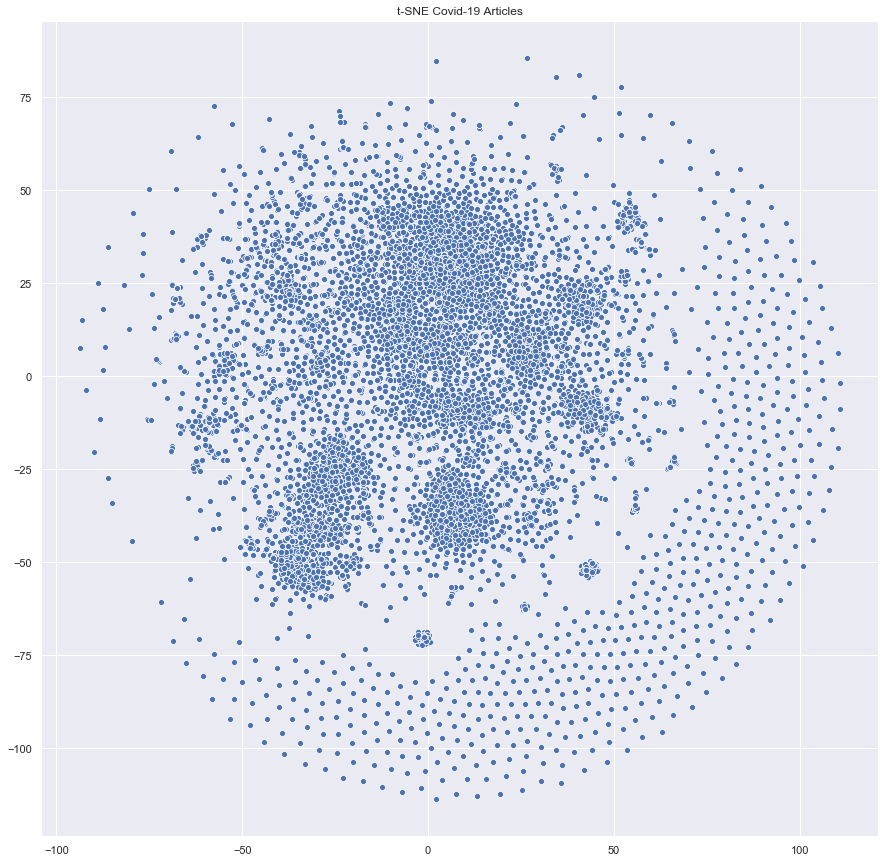

In [42]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)

plt.title("t-SNE Covid-19 Articles")
# plt.savefig("plots/t-sne_covid19.png")
plt.show()

We can clearly see few clusters forming. This may be a good sign that we are able to cluster similar articles together using 2-grams and HashVectorizer with 2**10 features. However, without labels it is difficult to see the clusters. For now, it looks like a blob of data... Let's try if we can use K-Means to generate our labels. We can later use this information to produce a scatterplot with labels to verify the clusters.

# Unsupervised Learning: Clustering with K-Means

Using K-means we will get the labels we need. For now, we will create 10 clusters. I am choosing this arbitrarily. We can change this later.

In [43]:
# 時間がかかります
start = time.time() # 計算前の時間取得

from sklearn.cluster import KMeans

k = 10
kmeans = KMeans(n_clusters=k, n_jobs=4, verbose=10)
y_pred = kmeans.fit_predict(X_train)

In [44]:
calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:04:35.675102


Labels for the training set:

In [45]:
y_train = y_pred

Labels for the test set:

In [46]:
y_test = kmeans.predict(X_test)

Now that we have the labels, let's plot the t-SNE. scatterplot again and see if we have any obvious clusters:

In [ ]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y_pred)))

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered")
plt.savefig("plots/t-sne_covid19_label.png")
plt.show()

That looks pretty promising. It can be seen that articles from the same cluster are near each other, forming groups. There are still overlaps. So we will have to see if we can improve this by changing the cluster size, using another clustering algorithm, or different feature size. We can also consider not using 2-grams, or HashVectorizer. We can try 3-grams, 4-grams, or plain text as our instances and vectorize them using either HashVectorizer, Tf-idfVectorizer, or Burrows Wheeler Transform Distance. <br>

Before we try another method for clustering, we want to see how well it will classify using the labels we just created using K-Means.

# Classify

### Helper Function:

In [ ]:
# function to print out classification model report
def classification_report(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='micro')) * 100), "%")
    print("        Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='micro')) * 100), "%")
    print("      F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='micro')) * 100), "%")

### Random Forest

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# random forest classifier instance
forest_clf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=4)

# cross validation on the training set 
forest_scores = cross_val_score(forest_clf, X_train, y_train, cv=3, n_jobs=4)

# print out the mean of the cross validation scores
print("Accuracy: ", '{:,.3f}'.format(float(forest_scores.mean()) * 100), "%")

In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_score, recall_score

# cross validate predict on the training set
forest_train_pred = cross_val_predict(forest_clf, X_train, y_train, cv=3, n_jobs=4)

# print precision and recall scores
print("Precision: ", '{:,.3f}'.format(float(precision_score(y_train, forest_train_pred, average='macro')) * 100), "%")
print("   Recall: ", '{:,.3f}'.format(float(recall_score(y_train, forest_train_pred, average='macro')) * 100), "%")

In [ ]:
# first train the model
forest_clf.fit(X_train, y_train)

# make predictions on the test set
forest_pred = forest_clf.predict(X_test)

In [ ]:
# print out the classification report
classification_report("Random Forest Classifier Report (Test Set)", y_test, forest_pred)

It looks like it doesn't overfit, which is good news. But results can be better than ~70-80%. So we might want to come back to this later again to see if we can improve it.  

# Vectorize Using Tf-idf with Plain Text
Let's see if we will be able to get better clusters using plain text as instances rather than 2-grams and vectorize it using Tf-idf. Last time we separated the dataset into test and training sets because we wanted to do classification with the labels we got through clustering. This time we will just use the all dataset because the goal is to cluster all literature.

### Vectorize

In [ ]:
# 時間がかかります
start = time.time() # 計算前の時間取得

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(max_features=2**12)
X = vectorizer.fit_transform(df_covid['body_text'].values)

calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

In [ ]:
X.shape

In [ ]:
X.heas()

In [ ]:
X.to_csv("X.csv", index=False)

# MiniBatchKMeans with Plain text and Tf-idf

Again, let's try to get our labels. We will choose 10 clusters again. This time, we will use MiniBatchKMeans as it is faster with more data:

In [55]:
from sklearn.cluster import MiniBatchKMeans

k = 10
kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)

Get the labels:

In [56]:
y = y_pred

# Dimensionality Reduction with t-SNE (Plain text and Tf-idf)

Let's reduce the dimensionality using t-SNE again:

In [57]:
# 時間がかなりかかります
start = time.time() # 計算前の時間取得

from sklearn.manifold import TSNE

tsne = TSNE(verbose=1)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 12500 samples in 18.575s...
[t-SNE] Computed neighbors for 12500 samples in 974.192s...
[t-SNE] Computed conditional probabilities for sample 1000 / 12500
[t-SNE] Computed conditional probabilities for sample 2000 / 12500
[t-SNE] Computed conditional probabilities for sample 3000 / 12500
[t-SNE] Computed conditional probabilities for sample 4000 / 12500
[t-SNE] Computed conditional probabilities for sample 5000 / 12500
[t-SNE] Computed conditional probabilities for sample 6000 / 12500
[t-SNE] Computed conditional probabilities for sample 7000 / 12500
[t-SNE] Computed conditional probabilities for sample 8000 / 12500
[t-SNE] Computed conditional probabilities for sample 9000 / 12500
[t-SNE] Computed conditional probabilities for sample 10000 / 12500
[t-SNE] Computed conditional probabilities for sample 11000 / 12500
[t-SNE] Computed conditional probabilities for sample 12000 / 12500
[t-SNE] Computed conditional probabilities for 

In [58]:
calc_time = time.time() - start # 計算時間
print("computing time : ", datetime.timedelta(seconds=calc_time))

computing time :  0:18:04.987782


In [60]:
X_embedded

array([[-40.953087 , -26.992138 ],
       [ 16.34148  , -34.142532 ],
       [ 56.770447 ,  -4.9492326],
       ...,
       [ -1.254758 ,  77.67629  ],
       [ 10.698728 , -23.32146  ],
       [ 58.51454  , -22.11971  ]], dtype=float32)

In [63]:
np.save("X_embedded.npy", X_embedded)

In [64]:
X_embedded = np.load(file="X_embedded.npy")

In [65]:
X_embedded

array([[-40.953087 , -26.992138 ],
       [ 16.34148  , -34.142532 ],
       [ 56.770447 ,  -4.9492326],
       ...,
       [ -1.254758 ,  77.67629  ],
       [ 10.698728 , -23.32146  ],
       [ 58.51454  , -22.11971  ]], dtype=float32)

### Plot t-SNE

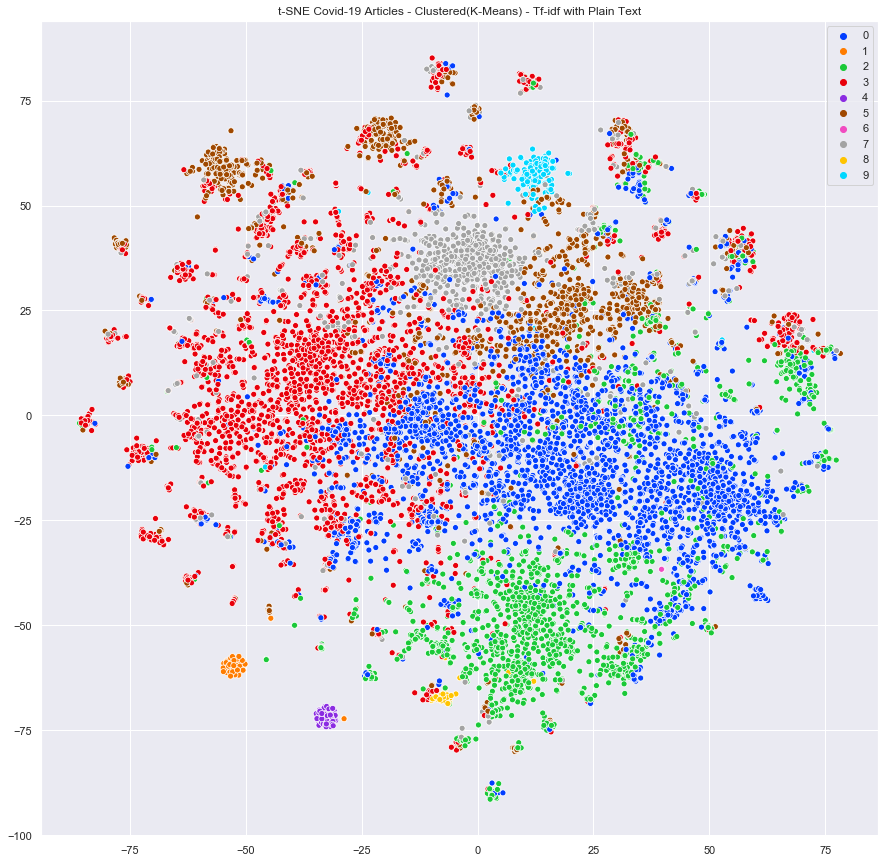

In [54]:
from matplotlib import pyplot as plt
import seaborn as sns

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y)))

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered(K-Means) - Tf-idf with Plain Text")
plt.savefig("plots/t-sne_covid19_label_TFID.png")
plt.show()

This time we are able to see the clusters more clearly. There are clusters that further apart from each other. I can also start to see that there is possibly more than 10 clusters we need to identify using k-means.

# Dimensionality Reduction with PCA (Plain text and Tf-idf)

t-SNE doesn't scale well. This is why run-time of this Notebook is about 40 minutes to 1 hour with an average computer. Let's try to see if we dan achive good results with PCA as it scales very well with larger datasets and dimensions:

In [55]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca_result = pca.fit_transform(X.toarray())

### Plot PCA

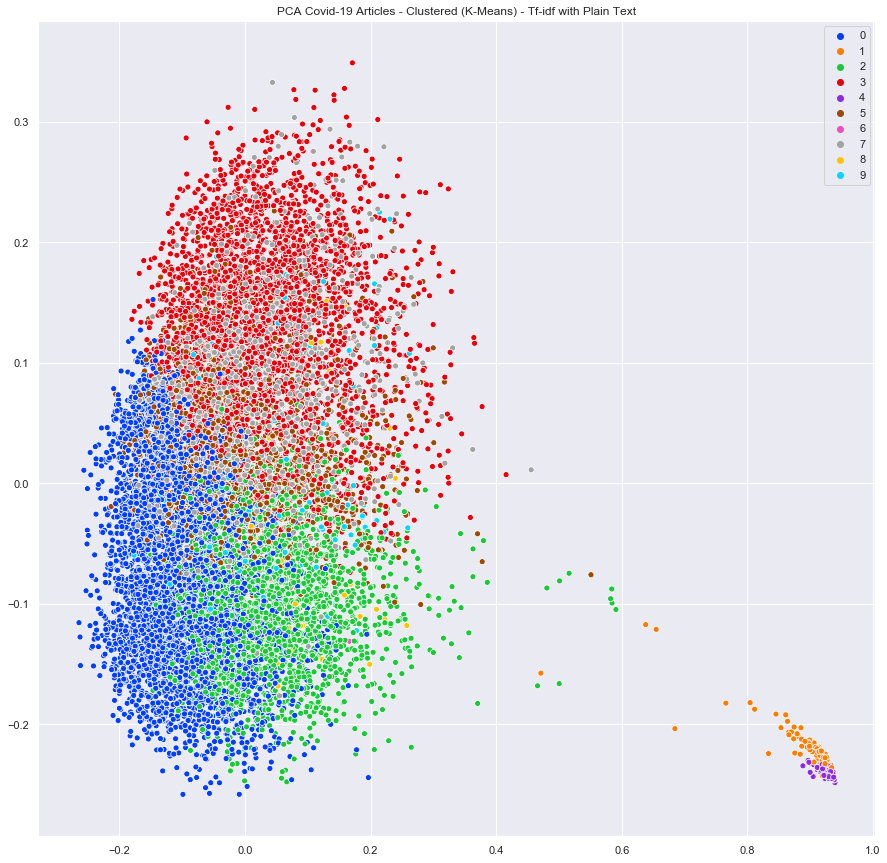

In [56]:
# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# colors
palette = sns.color_palette("bright", len(set(y)))

# plot
sns.scatterplot(pca_result[:,0], pca_result[:,1], hue=y, legend='full', palette=palette)
plt.title("PCA Covid-19 Articles - Clustered (K-Means) - Tf-idf with Plain Text")
plt.savefig("plots/pca_covid19_label_TFID.png")
plt.show()

Sometimes it may be easier to see the results in a 3 dimensional plot. So let's try to do that:

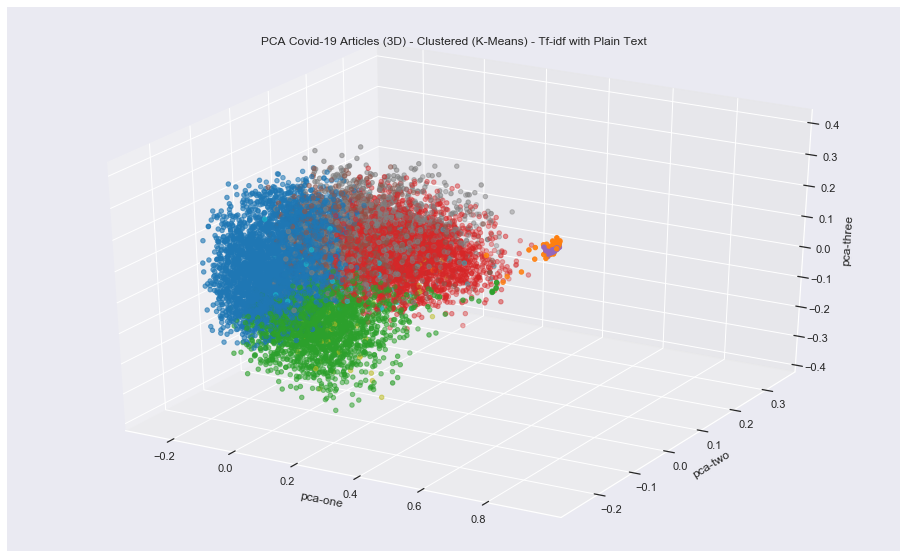

In [57]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=pca_result[:,0], 
    ys=pca_result[:,1], 
    zs=pca_result[:,2], 
    c=y, 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.title("PCA Covid-19 Articles (3D) - Clustered (K-Means) - Tf-idf with Plain Text")
plt.savefig("plots/pca_covid19_label_TFID_3d.png")
plt.show()

# More Clusters?
On our previous plot we could see that there is more clusters than only 10. Let's try to label them:

In [66]:
from sklearn.cluster import MiniBatchKMeans

k = 20
kmeans = MiniBatchKMeans(n_clusters=k)
y_pred = kmeans.fit_predict(X)
y = y_pred

In [67]:
y

array([13,  0,  0, ..., 13, 10,  6])

In [68]:
np.save("y.npy",y)

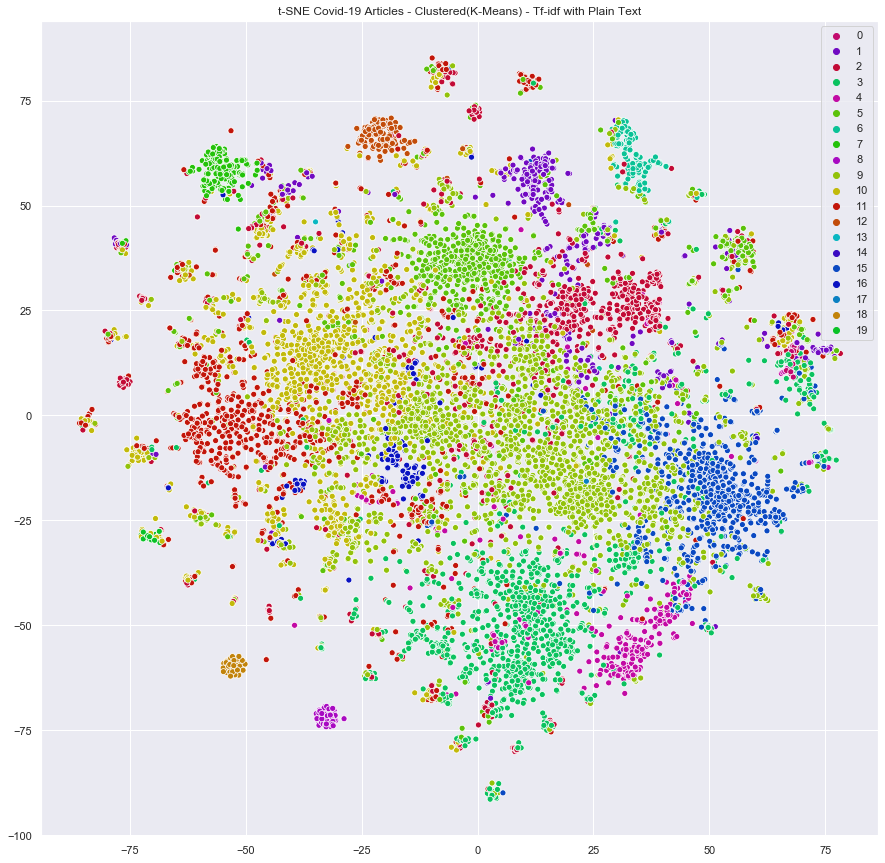

In [59]:
from matplotlib import pyplot as plt
import seaborn as sns
import random 

# sns settings
sns.set(rc={'figure.figsize':(15,15)})

# let's shuffle the list so distinct colors stay next to each other
palette = sns.hls_palette(20, l=.4, s=.9)
random.shuffle(palette)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y, legend='full', palette=palette)
plt.title("t-SNE Covid-19 Articles - Clustered(K-Means) - Tf-idf with Plain Text")
# plt.savefig("plots/t-sne_covid19_20label_TFID.png")
plt.show()

It would be helpful if we have a demo tool that can be used to see what articles are identified as similar using our Clustering and Dimensionality Reduction, right? Let's put together a interactive scatter plot of t-SNE to do that.

# Interactive t-SNE

In [60]:
# conda install bokeh==1.4.0 (最新のバージョン2.0.0 ではエラー)

from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap
from bokeh.io import output_file, show
from bokeh.transform import transform
from bokeh.io import output_notebook
from bokeh.plotting import figure
from bokeh.layouts import column
from bokeh.models import RadioButtonGroup
from bokeh.models import TextInput
from bokeh.layouts import gridplot
from bokeh.models import Div
from bokeh.models import Paragraph
from bokeh.layouts import column, widgetbox

output_notebook()
y_labels = y_pred

# data sources
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1],
    x_backup = X_embedded[:,0],
    y_backup = X_embedded[:,1],
    desc= y_labels, 
    titles= df_covid['title'],
    authors = df_covid['authors'],
    journal = df_covid['journal'],
    abstract = df_covid['abstract_summary'],
    labels = ["C-" + str(x) for x in y_labels]
    ))

# hover over information
hover = HoverTool(tooltips=[
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}"),
],
                 point_policy="follow_mouse")

# map colors
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure
p = figure(plot_width=800, plot_height=800, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset'], 
           title="t-SNE Covid-19 Articles, Clustered(K-Means), Tf-idf with Plain Text", 
           toolbar_location="right")

# plot
p.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend = 'labels')

# add callback to control 
callback = CustomJS(args=dict(p=p, source=source), code="""
            
            var radio_value = cb_obj.active;
            var data = source.data; 
            
            x = data['x'];
            y = data['y'];
            
            x_backup = data['x_backup'];
            y_backup = data['y_backup'];
            
            labels = data['desc'];
            
            if (radio_value == '20') {
                for (i = 0; i < x.length; i++) {
                    x[i] = x_backup[i];
                    y[i] = y_backup[i];
                }
            }
            else {
                for (i = 0; i < x.length; i++) {
                    if(labels[i] == radio_value) {
                        x[i] = x_backup[i];
                        y[i] = y_backup[i];
                    } else {
                        x[i] = undefined;
                        y[i] = undefined;
                    }
                }
            }


        source.change.emit();
        """)

# callback for searchbar
keyword_callback = CustomJS(args=dict(p=p, source=source), code="""
            
            var text_value = cb_obj.value;
            var data = source.data; 
            
            x = data['x'];
            y = data['y'];
            
            x_backup = data['x_backup'];
            y_backup = data['y_backup'];
            
            abstract = data['abstract'];
            titles = data['titles'];
            authors = data['authors'];
            journal = data['journal'];

            for (i = 0; i < x.length; i++) {
                if(abstract[i].includes(text_value) || 
                   titles[i].includes(text_value) || 
                   authors[i].includes(text_value) || 
                   journal[i].includes(text_value)) {
                    x[i] = x_backup[i];
                    y[i] = y_backup[i];
                } else {
                    x[i] = undefined;
                    y[i] = undefined;
                }
            }
            


        source.change.emit();
        """)

# option
option = RadioButtonGroup(labels=["C-0", "C-1", "C-2",
                                  "C-3", "C-4", "C-5",
                                  "C-6", "C-7", "C-8",
                                  "C-9", "C-10", "C-11",
                                  "C-12", "C-13", "C-14",
                                  "C-15", "C-16", "C-17",
                                  "C-18", "C-19", "All"], 
                          active=20, callback=callback)

# search box
keyword = TextInput(title="Search:", callback=keyword_callback)

#header
header = Div(text="""<h1>COVID-19 Literature Cluster</h1>""")

# show
show(column(header, widgetbox(option, keyword),p))

Loading BokehJS ...

#### Please see the tools on right top.
#### If the text doesn't fit in the screen on the above plot when hover, please try the 'Box Zoom' tool to zoom to the area where the target plot is. This will help the hover message to fit the screen. 
#### Use the 'Reset' button to revert the zoom.